# Accenture questionnaire analysis 

## Import packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.miscmodels.ordinal_model import OrderedModel
from pymer4.models import Lmer
from pySankey.sankey import sankey

In [2]:
! pip list

Package                   Version
------------------------- --------------
anyio                     4.6.0
appnope                   0.1.4
argon2-cffi               23.1.0
argon2-cffi-bindings      21.2.0
arrow                     1.3.0
asttokens                 2.4.1
async-lru                 2.0.4
attrs                     24.2.0
babel                     2.16.0
beautifulsoup4            4.12.3
bleach                    6.1.0
certifi                   2024.8.30
cffi                      1.17.1
charset-normalizer        3.3.2
comm                      0.2.2
contourpy                 1.3.0
cycler                    0.12.1
debugpy                   1.8.6
decorator                 5.1.1
defusedxml                0.7.1
executing                 2.1.0
fastjsonschema            2.20.0
fonttools                 4.54.1
fqdn                      1.5.1
fuzzywuzzy                0.18.0
h11                       0.14.0
httpcore                  1.0.6
httpx                     0.27.2
idna         

In [3]:
data = pd.read_csv('quaire_pilot_data_summary.csv')

In [4]:
data.head(20)

,PID,PROLIFIC_PID,title,organisation,description,years,experience,division,ONET,ONET_13_text,...,positive_after,worried_before,worried_after,purpose,familiarisation_1,familiarisation_2,familiarisation_3,familiarisation_4,familiarisation_5,familiarisation_6
0,R_8NDEbOqUzSKMqMX,5993260f4f3a820001fb39a7,process team leader,trt,"Work in the aviation parts repair industry, I ...",5,5,1,"6,7,9,10,11",NaN,...,50,0,1,how people perceive their job and tasks at hand,2,1,3,1,1,1
1,R_2pG93h4gxkuE9TU,6599643febd11bae8858cc8a,Station operative,Train station,Station operator at train station in london,10,10,1,"1,5,6,7,9",NaN,...,100,11,11,How to train a robot to do jobs / what skills ...,1,1,1,2,3,1
2,R_2sYcdOeGyPxLkzf,5c446608f8b8560001e7c54c,Pilot,Airline,Fly aircraft,3,18,1,"1,5,6,9,11",NaN,...,72,21,20,Human skills,1,3,1,1,1,1
3,R_3CEdKlpjQA6rhds,664e21d29d1e2067c8d41f08,Letter Carrier,Canada Post,"Delivering mail, parcels, and flyers for the c...",26,30,1,"5,6,7,9,13",sortation and preparation,...,70,20,30,determining the different skill sets needed to...,2,1,3,1,1,1
4,R_8BfcpMADzErHYJz,65ca24858bf6730c50291738,Operations manager,QVC,Operations manager in the distribution of good...,4,6,1,"3,5,8,9,11",NaN,...,70,75,80,Finding out what tasks people need to do to pe...,1,1,1,1,1,1
5,R_1XvuuutmXcnsgDf,63c0b8e25159ad47312132ac,Skilled laborer,Construction Company,"I address machinery issues, operate machines f...",10,25,1,"4,7,9,10,11",NaN,...,95,21,4,I thought it was about the abilities individua...,1,1,3,1,2,1
6,R_3qg7ERK8Q3qd8Z6,56f1d53bf2df32000b8f3748,Produce Team Receiver,Whole Foods,"I work in the produce department, my main job ...",0,14,1,"2,5,7,9,12",NaN,...,10,20,20,It seemed like a judgement of how I perceive m...,2,1,1,1,1,1
7,R_2XjYvAE6GtBMnLz,5a775b638fe2dc00010579b2,qc lead supervisor,oakland international,Looking after the quality inspection of fresh ...,5,5,1,"6,7,8,9,12",NaN,...,80,18,19,see how people percive there jobs,1,3,1,2,1,3
8,R_2E0rSO2Y99LNqc5,665cc3df1329066906fba1ad,HGV Driver,Bidfood,"I am a HGV Driver, i work for bidfood within t...",1,3,1,"5,6,7,9,10",NaN,...,100,0,0,Its understanding a job role and using it to g...,2,1,3,1,3,1
9,R_3j6dqnJ76PMj3K0,66708c3d9418ec5491c5483e,locomotive engineer,CNR,"Driving trains, servicing customers",1,6,1,"1,5,6,7,9",NaN,...,87,23,23,How people see their own times when broken down,2,1,3,1,1,1


In [5]:
data.dtypes

PID                  object
PROLIFIC_PID         object
title                object
organisation         object
description          object
                      ...  
familiarisation_2     int64
familiarisation_3     int64
familiarisation_4     int64
familiarisation_5     int64
familiarisation_6     int64
Length: 376, dtype: object

In [6]:
data.describe(include='all')

,PID,PROLIFIC_PID,title,organisation,description,years,experience,division,ONET,ONET_13_text,...,positive_after,worried_before,worried_after,purpose,familiarisation_1,familiarisation_2,familiarisation_3,familiarisation_4,familiarisation_5,familiarisation_6
count,140,140,140,139,140,140.000000,140.000000,140.000000,140,5,...,140.000000,140.000000,140.000000,137,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000
unique,140,136,135,130,140,NaN,NaN,NaN,108,5,...,NaN,NaN,NaN,133,NaN,NaN,NaN,NaN,NaN,NaN
top,R_8NDEbOqUzSKMqMX,6599643febd11bae8858cc8a,Customer Assistant,manufacturing,"Work in the aviation parts repair industry, I ...",NaN,NaN,NaN,"1,5,6,8,9",sortation and preparation,...,NaN,NaN,NaN,Building a robot to do my job,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,2,2,4,1,NaN,NaN,NaN,4,1,...,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,5.707143,10.150000,3.585714,NaN,NaN,...,67.628571,34.357143,36.635714,NaN,1.407143,1.242857,1.400000,1.164286,1.192857,1.135714
std,NaN,NaN,NaN,NaN,NaN,6.095754,7.950318,1.635865,NaN,NaN,...,25.147720,30.146661,31.278331,NaN,0.586373,0.633268,0.727665,0.503380,0.573973,0.497631
min,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN,NaN,...,0.000000,0.000000,0.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,NaN,NaN,NaN,NaN,NaN,2.000000,4.750000,2.000000,NaN,NaN,...,50.000000,10.000000,10.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,NaN,NaN,NaN,NaN,NaN,3.500000,8.000000,4.000000,NaN,NaN,...,70.000000,23.000000,30.500000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,NaN,NaN,NaN,NaN,NaN,7.000000,15.000000,5.000000,NaN,NaN,...,89.000000,56.000000,61.500000,NaN,2.000000,1.000000,2.000000,1.000000,1.000000,1.000000


In [7]:
division_mapping = {
    1: 'Manual and physical: Warehouse or logistics',
    2: 'Manual and physical: Manufacture, maintenance, or repair',
    3: 'Computer or digital: Numerical, data, or programming',
    4: 'Computer or office: Administrative, organizational, or planning',
    5: 'Computer or office: Customer service, marketing, or HR',
    6: 'Face to Face: Hospitality, sales, or client care'
}

In [8]:
division_counts = data['division'].value_counts()
division_counts.rename(index=division_mapping)

division
Computer or office: Administrative, organizational, or planning    33
Computer or digital: Numerical, data, or programming               24
Face to Face: Hospitality, sales, or client care                   23
Manual and physical: Warehouse or logistics                        20
Manual and physical: Manufacture, maintenance, or repair           20
Computer or office: Customer service, marketing, or HR             20
Name: count, dtype: int64

## Job Tasks

### Job titles by division

{'commercial truck driver': 1, 'customer assistant': 1, 'hgv driver': 1, 'learning ambassador': 1, 'letter carrier': 1, 'locomotive engineer': 2, 'machine operator': 1, 'mailman': 1, 'operations manager': 1, 'pilot': 1, 'process team leader': 1, 'produce team receiver': 1, 'qc lead supervisor': 1, 'skilled laborer': 1, 'station operative': 2, 'warehouse associate': 2, 'warehouse order selector': 1}
{'bakery clerk': 1, 'electrician': 1, 'gardener': 1, 'guttering fitter': 1, 'installation engineer': 1, 'joiner': 1, 'labourer': 1, 'machine operative': 1, 'machine operator': 1, 'manufacturer': 1, 'material handler': 1, 'mechanical department employee': 1, 'plumber': 1, 'production manager': 2, 'production operative': 1, 'production site supervisor': 1, 'proprietor': 1, 'technician': 2}
{'ai scientist': 1, 'backend developer': 1, 'chief technical officer': 1, 'data analyst': 1, 'data annotator/analyst': 1, 'finance team leader': 1, 'illustrator': 1, 'intern programmer': 1, 'it manager': 1, 

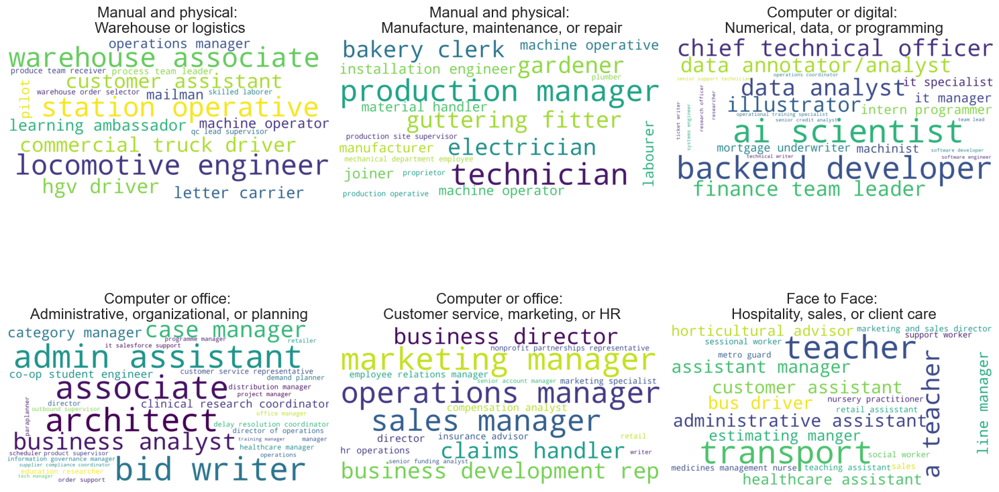

In [9]:
# Create a dictionary to store job titles by division
data['title'] = data['title'].str.strip().str.lower()

division_jobs_counts = data.groupby(['division', 'title']).size().reset_index(name='count')

plt.figure(figsize=(15, 10))
for i, division in enumerate(division_jobs_counts['division'].unique(), 1):
    # Use the division name and count of jobs to create a word cloud
    filtered_data = division_jobs_counts[division_jobs_counts['division'] == division]
    job_counts = dict(zip(filtered_data['title'], filtered_data['count']))
    print(job_counts)
    division_name = division_mapping[division].replace(':', ':\n')  # Get the division name and format it
    plt.subplot(2, 3, i)  # Create a 2x3 grid for word clouds

    # Generate the word cloud from frequency dictionary
    wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False,
                          relative_scaling=0.5,max_font_size=80,scale=3).generate_from_frequencies(job_counts)

    # Display the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'{division_name}', fontsize=16)
    plt.axis('off')

plt.tight_layout()
plt.show()

NOTES:
- all these have 1 to 3 people specifying them

### Companies people work for

"What organisation do you work for?"

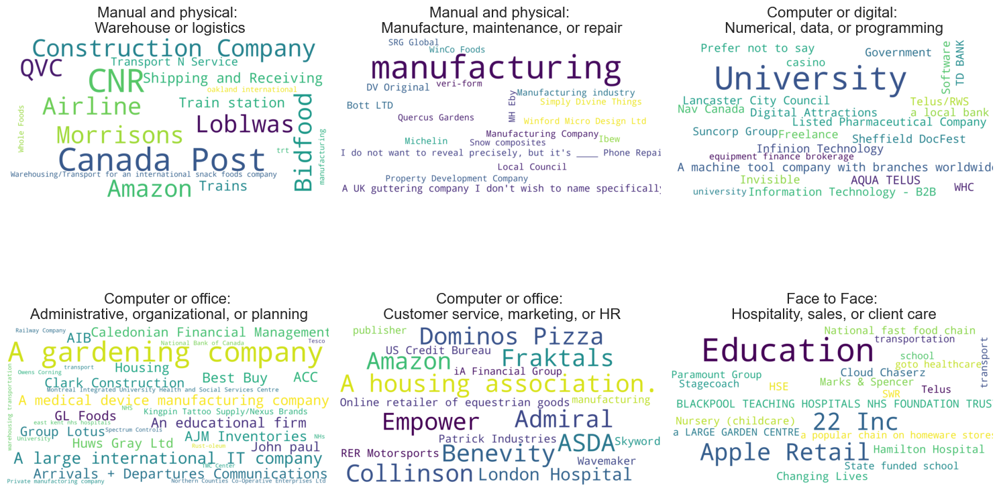

In [10]:
division_orgs_counts = data.groupby(['division', 'organisation']).size().reset_index(name='count')

# Now generate the word cloud for each division
plt.figure(figsize=(15, 10))
for i, division in enumerate(division_orgs_counts['division'].unique(), 1):
    # Use the division name and count of orgs to create a word cloud
    filtered_data = division_orgs_counts[division_orgs_counts['division'] == division]
    org_counts = dict(zip(filtered_data['organisation'], filtered_data['count']))
    #print(org_counts)
    division_name = division_mapping[division].replace(':', ':\n')  # Get the division name and format it
    plt.subplot(2, 3, i)  # Create a 2x3 grid for word clouds

    # Generate the word cloud from frequency dictionary
    wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False,
                          relative_scaling=0.5,max_font_size=80,scale=3).generate_from_frequencies(org_counts)

    # Display the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'{division_name}', fontsize=16)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [11]:
data.groupby('division')['organisation'].apply(lambda x: ', '.join(x.astype(str))).reset_index()


,division,organisation
0,1,"trt, Train station, Airline , Canada Post, QVC..."
1,2,"Property Development Company, Local Council, M..."
2,3,"university, Suncorp Group, Nav Canada, Digital..."
3,4,"A medical device manufacturing company, east k..."
4,5,"Admiral, manufacturing, Collinson, Patrick Ind..."
5,6,"Paramount Group , HSE, Hamilton Hospital, Stat..."


### Years in the current job

"How many years have you been working in your current role?"

In [12]:
data['division_map'] = data['division'].map(division_mapping)
data['division_map']

0           Manual and physical: Warehouse or logistics
1           Manual and physical: Warehouse or logistics
2           Manual and physical: Warehouse or logistics
3           Manual and physical: Warehouse or logistics
4           Manual and physical: Warehouse or logistics
                             ...                       
135    Face to Face: Hospitality, sales, or client care
136    Face to Face: Hospitality, sales, or client care
137    Face to Face: Hospitality, sales, or client care
138    Face to Face: Hospitality, sales, or client care
139    Face to Face: Hospitality, sales, or client care
Name: division_map, Length: 140, dtype: object

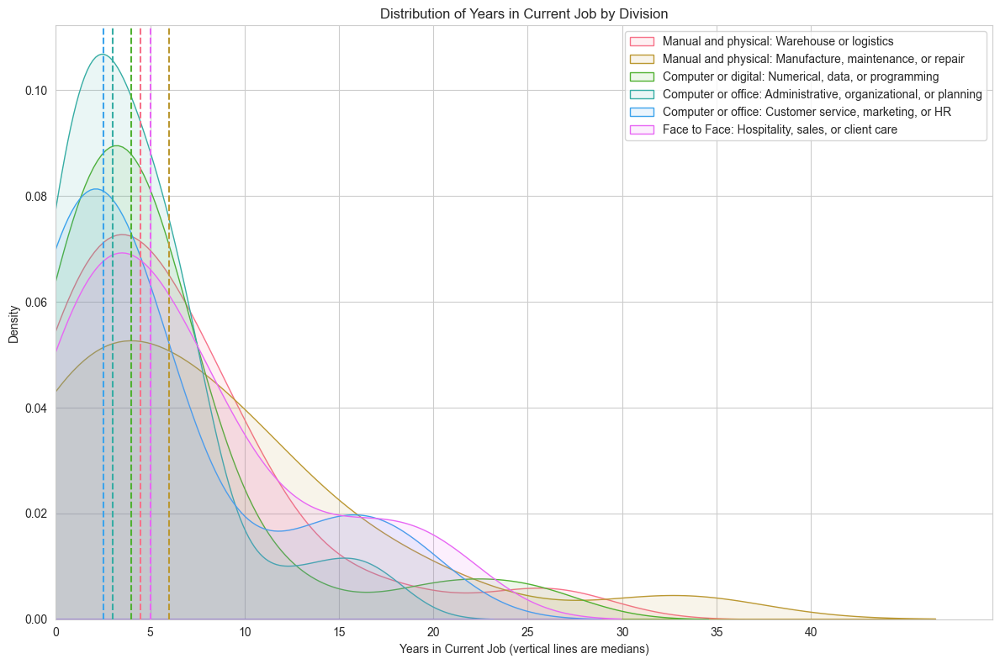

In [13]:
plt.figure(figsize=(12, 8))

palette = sns.color_palette("husl", len(data['division_map'].unique()))

# Iterate through each division
for i, division in enumerate(data['division_map'].unique()):
    # Subset the data for each division
    division_data = data[data['division_map'] == division]['years']
    
    # Plot the distribution
    sns.kdeplot(division_data, label=division, color=palette[i], fill=True, alpha=0.1)
    #sns.histplot(division_data, label=division_mapping[division], kde=False, bins=5, color=palette[i], alpha=0.5)
    # Plot the mean as a vertical line
    plt.axvline(division_data.median(), color=palette[i], linestyle='--')

plt.xlim(left=0)
plt.xticks(range(0, 41, 5))
plt.xlabel('Years in Current Job (vertical lines are medians)')
plt.ylabel('Density')
plt.title('Distribution of Years in Current Job by Division')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

NOTES:
- manufacture, maintenance or repair longest in current job
- customer service, marketing, hr shortest (people change jobs more often?)

### Years of experience

"How many years experience do you have working in your field?"

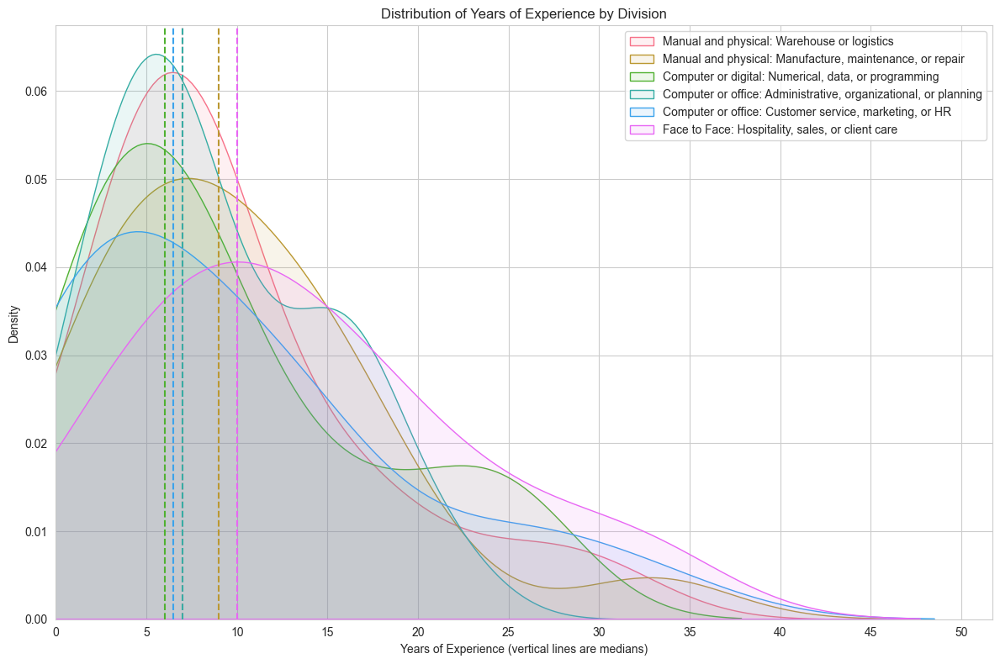

In [14]:
plt.figure(figsize=(12, 8))

palette = sns.color_palette("husl", len(data['division_map'].unique()))

# Iterate through each division
for i, division in enumerate(data['division_map'].unique()):
    # Subset the data for each division
    division_data = data[data['division_map'] == division]['experience']
    
    # Plot the distribution
    sns.kdeplot(division_data, label=division, color=palette[i], fill=True, alpha=0.1)
    #sns.histplot(division_data, label=division_mapping[division], kde=False, bins=5, color=palette[i], alpha=0.5)
    # Plot the mean as a vertical line
    plt.axvline(division_data.median(), color=palette[i], linestyle='--')

plt.xlim(left=0)
plt.xticks(range(0, 51, 5))
plt.xlabel('Years of Experience (vertical lines are medians)')
plt.ylabel('Density')
plt.title('Distribution of Years of Experience by Division')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

NOTES:
- hospitality, sales, or client care most experienced
- numerical, data or programming least
- probably confounded by age: hospitality etc. may older participants compared to programmers

### Familiarisation questions

In [15]:
familiarisation_columns = [f'familiarisation_{i}' for i in range(1, 7)]
fam_results = data[familiarisation_columns].eq(1).astype(int)
fam_results.columns = [f'{col}_bin' for col in familiarisation_columns]
data = pd.concat([data, fam_results], axis=1)
data['familiarisation_sum'] = fam_results.sum(axis=1)
data['familiarisation_sum']

0      4
1      4
2      5
3      4
4      6
      ..
135    6
136    4
137    5
138    6
139    5
Name: familiarisation_sum, Length: 140, dtype: int64

Text(0.5, 1.0, 'Number of Correct Familiarisation Questions by Division (out of max 6)')

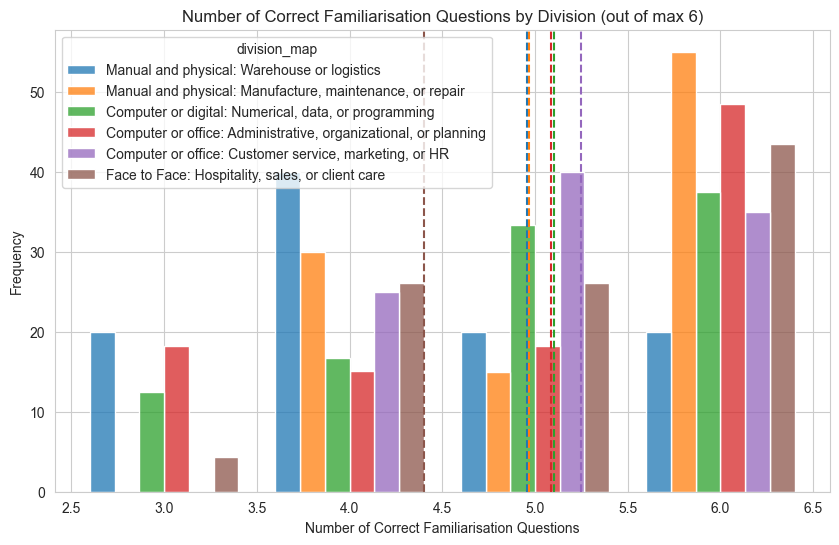

In [16]:
plt.figure(figsize=(10, 6))
sns.histplot(data, x="familiarisation_sum", hue="division_map", multiple="dodge", discrete=True, shrink=.8, 
             stat="percent", common_norm=False)

means = data.groupby('division_map',observed=True)['familiarisation_sum'].mean()

# Step 3: Add vertical lines for the mean of each division
# Get the color palette used by seaborn
palette = sns.color_palette()

# Loop over each division and plot a vertical line at the mean
for i, (division, mean_value) in enumerate(means.items()):
    plt.axvline(mean_value, color=palette[i], linestyle='--', label=f'{division} Mean: {mean_value:.2f}')


# Set labels and title
plt.xlabel('Number of Correct Familiarisation Questions')
plt.ylabel('Frequency')
plt.title('Number of Correct Familiarisation Questions by Division (out of max 6)')

In [17]:
data.groupby('division_map')['familiarisation_sum'].mean()

division_map
Computer or digital: Numerical, data, or programming               4.958333
Computer or office: Administrative, organizational, or planning    4.969697
Computer or office: Customer service, marketing, or HR             5.100000
Face to Face: Hospitality, sales, or client care                   5.086957
Manual and physical: Manufacture, maintenance, or repair           5.250000
Manual and physical: Warehouse or logistics                        4.400000
Name: familiarisation_sum, dtype: float64

NOTES:
- warehouse or logistics people least likely to answer all questions
- interestingly, manufacture, maintenance or repair most likely to answer all correctly

In [18]:
# Melt the familiarisation_*_bin columns into a single column
melted_data_fam = pd.melt(data,
                      id_vars=['PID', 'division_map'],  # Keep these columns intact
                      value_vars=[f'familiarisation_{i}_bin' for i in range(1, 7)],  # Melt familiarisation columns
                      var_name='familiarisation',  # Name for the new 'familiarisation' column
                      value_name='familiarisation_bin')  # Name for the values (1s and 0s)

# Display the new dataset
len(melted_data_fam['PID'].unique())

140

In [19]:
import rpy2.robjects as ro

# Run the R command to install the package
ro.r('install.packages("lmerTest")')

--- Please select a CRAN mirror for use in this session ---
Secure CRAN mirrors 

 1: 0-Cloud [https]
 2: Australia (Canberra) [https]
 3: Australia (Melbourne 1) [https]
 4: Australia (Melbourne 2) [https]
 5: Austria [https]
 6: Belgium (Brussels) [https]
 7: Brazil (PR) [https]
 8: Brazil (SP 1) [https]
 9: Brazil (SP 2) [https]
10: Bulgaria [https]
11: Canada (MB) [https]
12: Canada (ON 1) [https]
13: Canada (ON 2) [https]
14: Chile (Santiago) [https]
15: China (Beijing 2) [https]
16: China (Beijing 3) [https]
17: China (Hefei) [https]
18: China (Hong Kong) [https]
19: China (Guangzhou) [https]
20: China (Jinan) [https]
21: China (Nanjing) [https]
22: China (Shanghai 2) [https]
23: China (Shenzhen) [https]
24: China (Wuhan) [https]
25: Colombia (Cali) [https]
26: Costa Rica [https]
27: Cyprus [https]
28: Czech Republic [https]
29: Denmark [https]
30: East Asia [https]
31: Ecuador (Cuenca) [https]
32: France (Lyon 1) [https]
33: France (Lyon 2) [https]
34: France (Marseille) [https]

R[write to console]: Error in contrib.url(repos, "source") : 
  trying to use CRAN without setting a mirror

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In doTryCatch(return(expr), name, parentenv, handler) :
R[write to console]: 
 
R[write to console]:  unable to load shared object '/Library/Frameworks/R.framework/Resources/modules//R_X11.so':
  dlopen(/Library/Frameworks/R.framework/Resources/modules//R_X11.so, 0x0006): Library not loaded: /opt/X11/lib/libSM.6.dylib
  Referenced from: <31EADEB5-0A17-3546-9944-9B3747071FE8> /Library/Frameworks/R.framework/Versions/4.4-arm64/Resources/modules/R_X11.so
  Reason: tried: '/opt/X11/lib/libSM.6.dylib' (no such file), '/System/Volumes/Preboot/Cryptexes/OS/opt/X11/lib/libSM.6.dylib' (no such file), '/opt/X11/lib/libSM.6.dylib' (no such file), '/usr/lib/libSM.6.dylib' (no such file, not in dyld cache)



RRuntimeError: Error in contrib.url(repos, "source") : 
  trying to use CRAN without setting a mirror


In [20]:
division_mapping_C = {
    'Manual and physical: Warehouse or logistics': -3,
    'Manual and physical: Manufacture, maintenance, or repair': -2,
    'Computer or digital: Numerical, data, or programming': -1,
    'Computer or office: Administrative, organizational, or planning': 1,
    'Computer or office: Customer service, marketing, or HR': 2,
    'Face to Face: Hospitality, sales, or client care': 3
}

# Create a new column 'division_C' by mapping the existing 'division' column to the defined values
data['division_C'] = data['division_map'].map(division_mapping_C)
data['division_C']

0     -3
1     -3
2     -3
3     -3
4     -3
      ..
135    3
136    3
137    3
138    3
139    3
Name: division_C, Length: 140, dtype: int64

In [21]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.miscmodels.ordinal_model import OrderedModel
from pymer4.models import Lmer
#model = smf.mixedlm("familiarisation_sum ~ C(division_map)", melted_data_fam, groups=data["PID"]).fit()

#model = smf.mixedlm("familiarisation_bin ~ C(division_map)", melted_data_fam, groups=melted_data_fam["PID"], family=sm.families.Binomial()).fit()

model_lm = smf.ols("familiarisation_sum ~ division_C", data=data)
#model = Lmer("familiarisation_bin  ~ division_map  + (1|PID)",data=melted_data_fam, family = 'binomial')

data['division_map'] = pd.Categorical(
    data['division_map'],
    categories=[
        'Manual and physical: Manufacture, maintenance, or repair',  # Reference category
        'Manual and physical: Warehouse or logistics',
        'Computer or digital: Numerical, data, or programming',
        'Computer or office: Administrative, organizational, or planning',
        'Computer or office: Customer service, marketing, or HR',
        'Face to Face: Hospitality, sales, or client care'
    ],
    ordered=True  # Keep this ordered to maintain a meaningful order if needed
)

model = OrderedModel(data['familiarisation_sum'],
                     pd.get_dummies(data['division_map'], drop_first=True),
                     distr='logit')

model1 = OrderedModel(data['familiarisation_sum'],
                     data['division_C'],
                     distr='logit')

#model = smf.poisson("familiarisation_sum ~ C(division_map)", data=data)

result = model_lm.fit()#(method='bfgs', maxiter=5000)
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     familiarisation_sum   R-squared:                       0.015
Model:                             OLS   Adj. R-squared:                  0.008
Method:                  Least Squares   F-statistic:                     2.130
Date:                 Sat, 12 Oct 2024   Prob (F-statistic):              0.147
Time:                         23:44:05   Log-Likelihood:                -200.91
No. Observations:                  140   AIC:                             405.8
Df Residuals:                      138   BIC:                             411.7
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.9565      0.087     57.184      0.000       4.785       5.128
division_C     0.0609      0.042      1.459      0.147      -0.022       0.143
==============================================================================
Omnibus:                       27.593   Durbin-Watson:                   2.097
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               10.969
Skew:                          -0.465   Prob(JB):                      0.00415
Kurtosis:                       1.992   Cond. No.                         2.08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

NOTES:
- difference in the number of correctly answered familiarisation questions does not seem significant between domains
- note that this is only for people who've answer 3 or more questions correctly (i.e. more than 50%)

In [22]:
print(data[['familiarisation_sum', 'division_C']].isnull().sum())
data[['familiarisation_sum', 'division_C']].dtypes

familiarisation_sum    0
division_C             0
dtype: int64


familiarisation_sum    int64
division_C             int64
dtype: object

## Tasks analysis

"Below there is a list of common job tasks.

Select 5 tasks from the list below that best summarise the day-to-day work you do as part of your job.

If there is a task that you believe is essential to your role, but there is no similar task included in the list below, select "other" to specify that task.

Tip: hover the cursor over a task for a concrete example"

### Task Rank and Number of hours

Rank

"Below is the list of 5 tasks you selected as being important for your job.

Drag and drop the tasks to rank them in order of importance, with the most important task at the top (1), and least important at the bottom (5)."

Hours of work

"The 5 important job tasks that you selected are listed again below.

Use the boxes to state approximately how many hours per week you dedicate to each task.

The time you spend on each task may be overlapping, so the 'total' number of hours may not precisely match the total number of hours that you work per week."

In [23]:
data_tasks_init = data.loc[:, : 'TaskSocial_15']

columns_to_remove = ['PROLIFIC_PID', 'title', 'organisation', 'description', 'years',
                     'experience', 'ONET', 'ONET_13_text', 'ONET_14_text', 'ONET_15_text']

# Remove columns that contain '13', '14', or '15' in their names, and specific columns
data_tasks = data_tasks_init.drop(columns=[col for col in data_tasks_init.columns if any(x in col for x in ['13', '14', '15']) or col in columns_to_remove])


data_tasks.columns

Index(['PID', 'division', 'TaskRank_1', 'TaskRank_2', 'TaskRank_3',
       'TaskRank_4', 'TaskRank_5', 'TaskRank_6', 'TaskRank_7', 'TaskRank_8',
       'TaskRank_9', 'TaskRank_10', 'TaskRank_11', 'TaskRank_12',
       'NumberHours_1', 'NumberHours_2', 'NumberHours_3', 'NumberHours_4',
       'NumberHours_5', 'NumberHours_6', 'NumberHours_7', 'NumberHours_8',
       'NumberHours_9', 'NumberHours_10', 'NumberHours_11', 'NumberHours_12',
       'TaskPhysical_1', 'TaskPhysical_2', 'TaskPhysical_3', 'TaskPhysical_4',
       'TaskPhysical_5', 'TaskPhysical_6', 'TaskPhysical_7', 'TaskPhysical_8',
       'TaskPhysical_9', 'TaskPhysical_10', 'TaskPhysical_11',
       'TaskPhysical_12', 'TaskSocial_1', 'TaskSocial_2', 'TaskSocial_3',
       'TaskSocial_4', 'TaskSocial_5', 'TaskSocial_6', 'TaskSocial_7',
       'TaskSocial_8', 'TaskSocial_9', 'TaskSocial_10', 'TaskSocial_11',
       'TaskSocial_12'],
      dtype='object')

In [24]:
# Define the columns you want to melt into long format
columns_to_melt = ['TaskRank', 'NumberHours', 'TaskPhysical', 'TaskSocial']

# Create the new DataFrame by melting the old columns
melted_dfs = []

for col_prefix in columns_to_melt:
    # Melt each set of columns into long format
    melted = pd.melt(data_tasks, id_vars=['PID', 'division'],
                     value_vars=[f'{col_prefix}_{i}' for i in range(1, 13)],
                     var_name='TaskNumber',
                     value_name=col_prefix)

    # Extract the task number from the column name
    melted['TaskNumber'] = melted['TaskNumber'].str.extract(r'(\d+)').astype(int)

    # Append the melted DataFrame to the list
    melted_dfs.append(melted)

# Concatenate all the melted DataFrames on axis=1
data_tasks_melted = pd.concat(melted_dfs, axis=1)
data_tasks_melted = data_tasks_melted.loc[:, ~data_tasks_melted.columns.duplicated()]

data_tasks_melted = data_tasks_melted.dropna(subset=['TaskRank', 'NumberHours', 'TaskPhysical', 'TaskSocial'], how='all')

task_mapping = {
    1: 'getting information',
    2: 'judging quality',
    3: 'analysing data',
    4: 'creativity',
    5: 'decision making',
    6: 'planning',
    7: 'manual work',
    8: 'computer work',
    9: 'communicating',
    10: 'building rapport',
    11: 'managing',
    12: 'admin'
}

# Create a new column 'TaskName' by mapping the 'TaskNumber' column to the task names
data_tasks_melted['TaskName_map'] = data_tasks_melted['TaskNumber'].map(task_mapping)
data_tasks_melted['division_map'] = data_tasks_melted['division'].map(division_mapping)
data_tasks_melted['InvertedTaskRank'] = 6 - data_tasks_melted['TaskRank']
# Display the new DataFrame
data_tasks_melted

,PID,division,TaskNumber,TaskRank,NumberHours,TaskPhysical,TaskSocial,TaskName_map,division_map,InvertedTaskRank
1,R_2pG93h4gxkuE9TU,1,1,2.0,5.0,4.0,90.0,getting information,Manual and physical: Warehouse or logistics,4.0
2,R_2sYcdOeGyPxLkzf,1,1,3.0,20.0,19.0,51.0,getting information,Manual and physical: Warehouse or logistics,3.0
9,R_3j6dqnJ76PMj3K0,1,1,5.0,20.0,18.0,76.0,getting information,Manual and physical: Warehouse or logistics,1.0
11,R_7rwbVvmEO37klGy,1,1,1.0,40.0,69.0,78.0,getting information,Manual and physical: Warehouse or logistics,5.0
12,R_2lXN7eLA5CWYXN4,1,1,2.0,5.0,95.0,68.0,getting information,Manual and physical: Warehouse or logistics,4.0
...,...,...,...,...,...,...,...,...,...,...
1662,R_2hB0xVsXrHTHLNG,6,12,5.0,4.5,72.0,47.0,admin,"Face to Face: Hospitality, sales, or client care",1.0
1664,R_8Tt7RocRliaFyl4,6,12,5.0,1.0,20.0,24.0,admin,"Face to Face: Hospitality, sales, or client care",1.0
1666,R_2o0wgTzsBsar6Xb,6,12,5.0,7.0,25.0,60.0,admin,"Face to Face: Hospitality, sales, or client care",1.0
1668,R_8wFf35APJDY8LbU,6,12,5.0,5.0,11.0,87.0,admin,"Face to Face: Hospitality, sales, or client care",1.0


In [25]:
data_tasks_melted.isnull().sum()

PID                 0
division            0
TaskNumber          0
TaskRank            0
NumberHours         0
TaskPhysical        0
TaskSocial          0
TaskName_map        0
division_map        0
InvertedTaskRank    0
dtype: int64

                     sum_rank  sum_hours
TaskName_map                            
admin                    62.0     285.50
analysing data          149.0     540.00
building rapport        120.0     373.00
communicating           282.0    1104.00
computer work           218.0    1465.50
creativity               78.0     187.00
decision making         324.0     998.25
getting information     177.0     590.00
judging quality         127.0     537.00
managing                112.0     363.00
manual work             154.0     910.00
planning                271.0     757.00


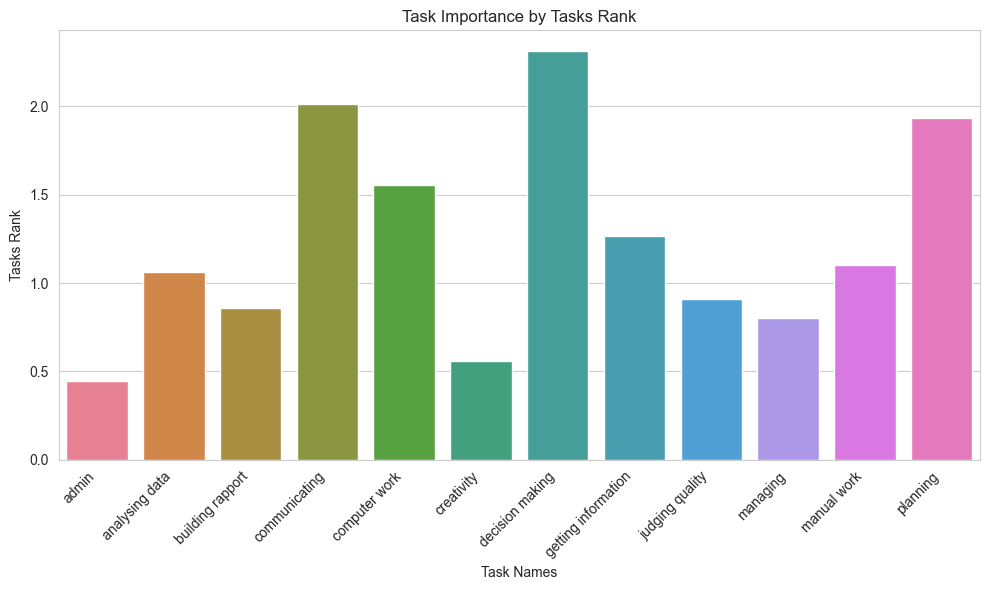

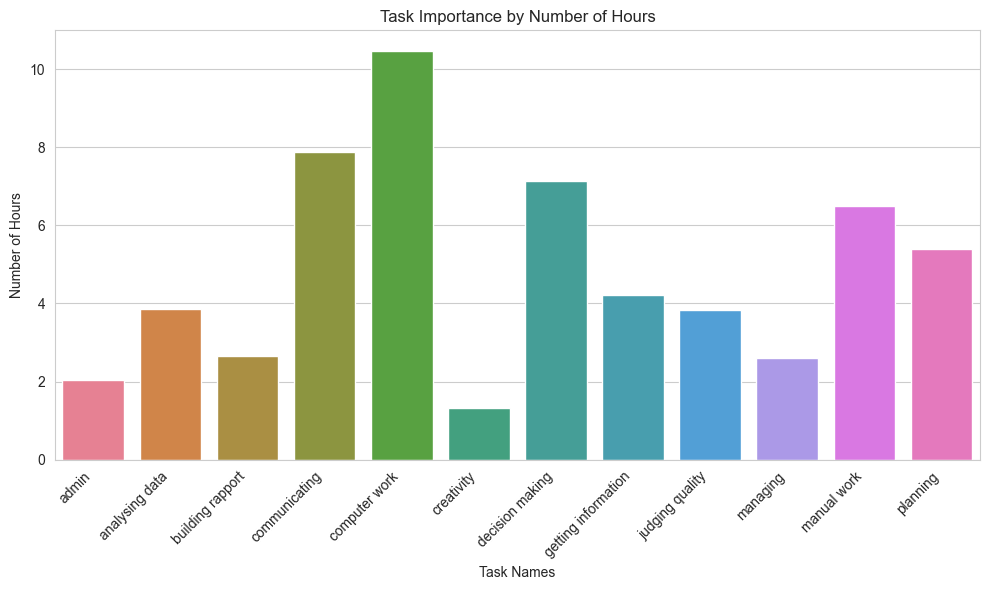

In [26]:
task_stats = data_tasks_melted.groupby('TaskName_map').agg(
    sum_rank=('InvertedTaskRank', 'sum'),
    sum_hours=('NumberHours', 'sum')
)

print(task_stats)

task_stats['task_rank_mean'] = task_stats['sum_rank'] / len(data_tasks_melted['PID'].unique())
task_stats['task_hours_mean'] = task_stats['sum_hours'] / len(data_tasks_melted['PID'].unique())

for col in ['task_rank_mean','task_hours_mean']:

    if col == 'task_rank_mean':
        title = 'Tasks Rank'
    else:
        title = 'Number of Hours'
    plt.figure(figsize=(10, 6))

    #sns.barplot(x='TaskName_map', y='InvertedTaskRank', data=data_tasks_melted, errorbar='se',hue='TaskName_map')
    sns.barplot(x='TaskName_map', y=col, data=task_stats, hue='TaskName_map', errorbar=None)
    # Set labels and title
    plt.xlabel('Task Names')
    plt.ylabel(f'{title}')
    plt.title(f'Task Importance by {title}')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

    # Show the plot
    plt.tight_layout()
    plt.show()

NOTES:
- seems the least important tasks by rank and num hours were admin and creativity
- 5 most important by rank: decision-making, communicating, planning, computer work (probably because of domains), getting information
- 5 most important by num hours: computer work, communicating, decision-making, manual work and planning
- generally rank and number of hours seem to agree on importance

,division_map,TaskName_map,sum_rank,sum_hours,total_people,task_rank_mean,task_hours_mean
0,"Computer or digital: Numerical, data, or progr...",admin,11.0,35.0,24,0.458333,1.458333
1,"Computer or digital: Numerical, data, or progr...",analysing data,46.0,170.0,24,1.916667,7.083333
2,"Computer or digital: Numerical, data, or progr...",building rapport,9.0,29.0,24,0.375000,1.208333
3,"Computer or digital: Numerical, data, or progr...",communicating,28.0,93.5,24,1.166667,3.895833
4,"Computer or digital: Numerical, data, or progr...",computer work,66.0,449.5,24,2.750000,18.729167
...,...,...,...,...,...,...,...
66,Manual and physical: Warehouse or logistics,getting information,25.0,113.0,20,1.250000,5.650000
67,Manual and physical: Warehouse or logistics,judging quality,12.0,116.0,20,0.600000,5.800000
68,Manual and physical: Warehouse or logistics,managing,16.0,58.0,20,0.800000,2.900000
69,Manual and physical: Warehouse or logistics,manual work,46.0,300.0,20,2.300000,15.000000


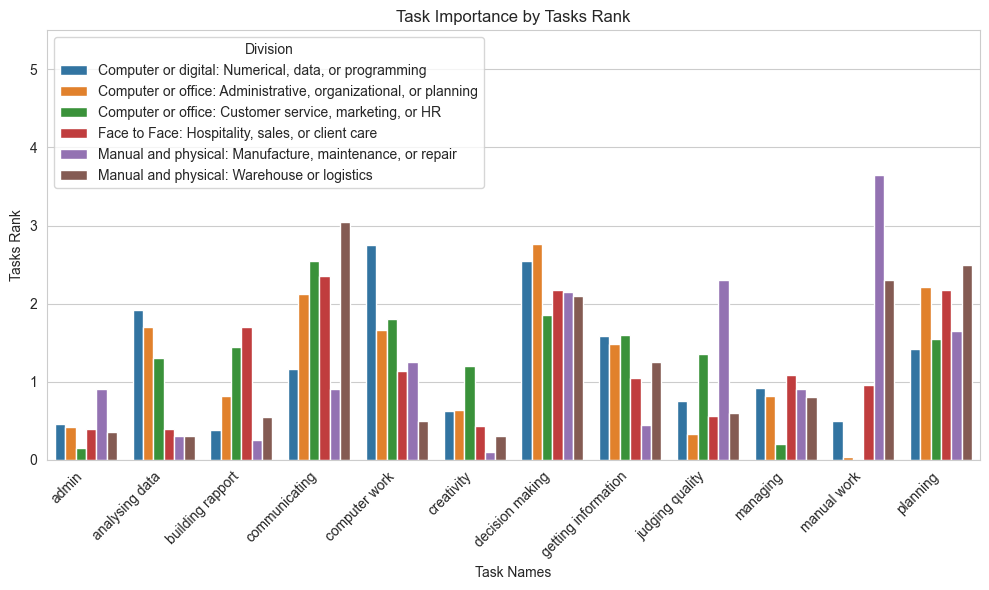

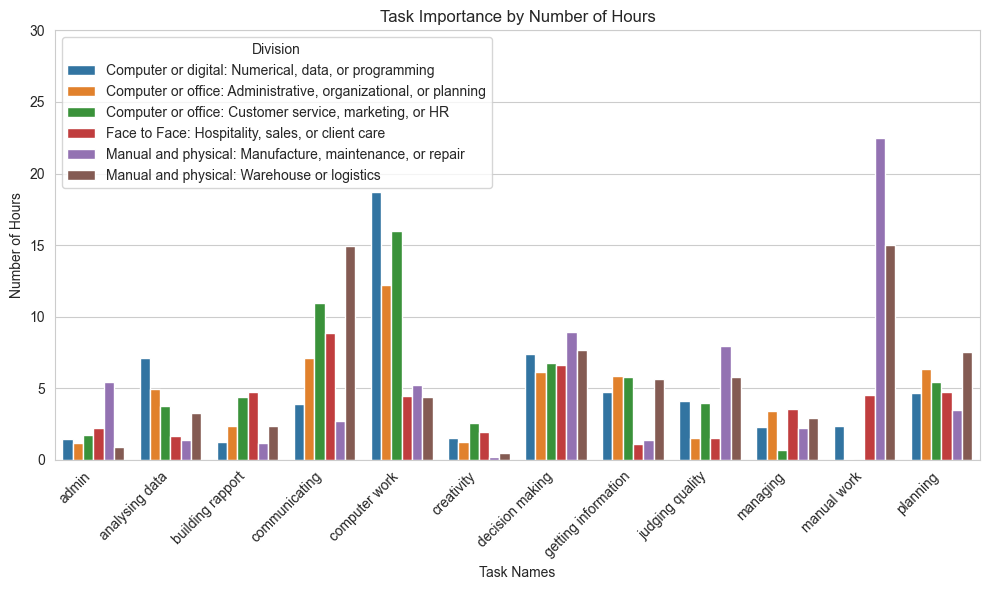

In [27]:
total_people_per_division = data_tasks_melted.groupby('division_map')['PID'].nunique().reset_index()
total_people_per_division.columns = ['division_map', 'total_people']


task_stats_div = data_tasks_melted.groupby(['division_map', 'TaskName_map']).agg(
    sum_rank=('InvertedTaskRank', 'sum'),
    sum_hours=('NumberHours', 'sum')
).reset_index()

task_stats_d = pd.merge(task_stats_div, total_people_per_division, on='division_map')
task_stats_d['task_rank_mean'] = task_stats_d['sum_rank'] / task_stats_d['total_people']
task_stats_d['task_hours_mean'] = task_stats_d['sum_hours'] / task_stats_d['total_people']


display(task_stats_d)

for col in ['task_rank_mean','task_hours_mean']:

    if col == 'task_rank_mean':
        title = 'Tasks Rank'
    else:
        title = 'Number of Hours'

    plt.figure(figsize=(10, 6))

    sns.barplot(x='TaskName_map', y=col, data=task_stats_d, hue='division_map', errorbar=None)
    # Set labels and title
    plt.xlabel('Task Names')
    plt.ylabel(f'{title}')
    plt.title(f'Task Importance by {title}')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.legend(title='Division', loc='upper left')
    plt.ylim(0, 5.5) if col == 'task_rank_mean' else plt.ylim(0, 30)

    # Show the plot
    plt.tight_layout()
    plt.show()

NOTES:
- admin and creativity low in all domains (for both rank and num hours)
- decision-making and planning important in all domains (for both rank and num hours)
- communicating important in all apart from numerical, data etc. and manufacture, maintenance. Very important in warehouse and logistics (for both rank and num hours)
- important just in a domain: computer work for computer domains; manual work and judging quality important in manufacture, maintenance (though num hours not far from warehouse or logistics); creativity most important for customer service (but not that important and num hours not high)

In [28]:
task_stats_d_sorted = task_stats_d.sort_values(by='task_rank_mean', ascending=False)
task_stats_d_sorted_hours = task_stats_d.sort_values(by='task_hours_mean', ascending=False)

# Group by 'division' and get the top 5 tasks for each division
top_5_tasks_per_division = task_stats_d_sorted.groupby('division_map').head(5)
top_5_tasks_per_division_hours = task_stats_d_sorted_hours.groupby('division_map').head(5)
top_5_tasks_per_division_hours

,division_map,TaskName_map,sum_rank,sum_hours,total_people,task_rank_mean,task_hours_mean
57,"Manual and physical: Manufacture, maintenance,...",manual work,73.0,449.00,20,3.650000,22.450000
4,"Computer or digital: Numerical, data, or progr...",computer work,66.0,449.50,24,2.750000,18.729167
28,"Computer or office: Customer service, marketin...",computer work,36.0,320.00,20,1.800000,16.000000
69,Manual and physical: Warehouse or logistics,manual work,46.0,300.00,20,2.300000,15.000000
62,Manual and physical: Warehouse or logistics,communicating,61.0,298.00,20,3.050000,14.900000
16,"Computer or office: Administrative, organizati...",computer work,55.0,402.00,33,1.666667,12.181818
27,"Computer or office: Customer service, marketin...",communicating,51.0,219.00,20,2.550000,10.950000
53,"Manual and physical: Manufacture, maintenance,...",decision making,43.0,179.00,20,2.150000,8.950000
38,"Face to Face: Hospitality, sales, or client care",communicating,54.0,204.00,23,2.347826,8.869565
55,"Manual and physical: Manufacture, maintenance,...",judging quality,46.0,159.00,20,2.300000,7.950000


### Top5

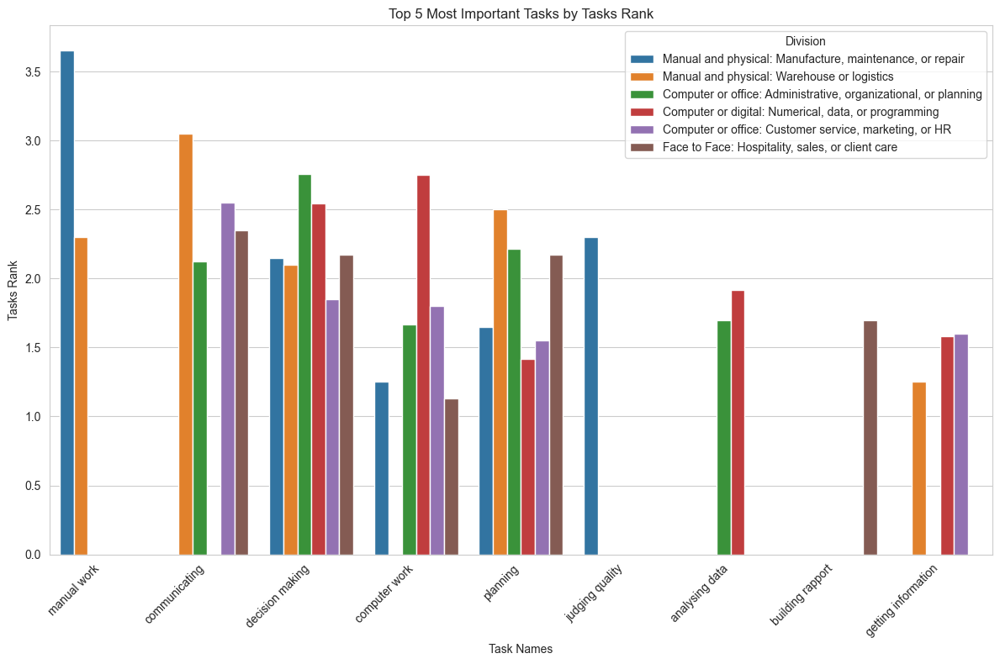

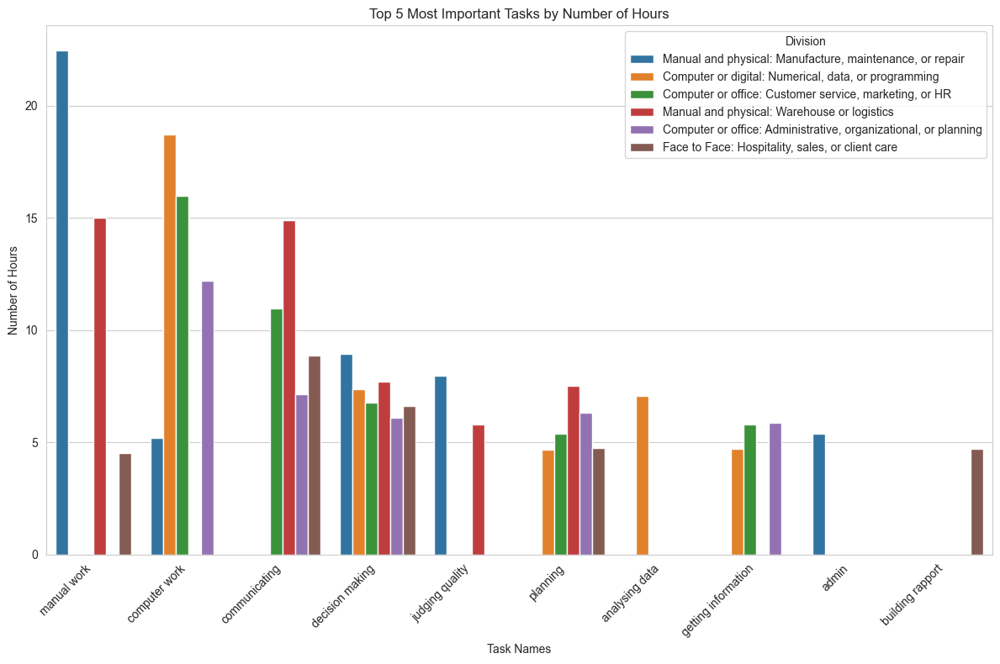

In [29]:
for col in ['task_rank_mean','task_hours_mean']:

    if col == 'task_rank_mean':
        title = 'Tasks Rank'
        df = top_5_tasks_per_division
    else:
        title = 'Number of Hours'
        df = top_5_tasks_per_division_hours


    plt.figure(figsize=(12, 8))
    sns.barplot(x='TaskName_map', y=col, hue='division_map', data=df)

    # Set labels and title
    plt.xlabel('Task Names')
    plt.ylabel(f'{title}')
    plt.title(f'Top 5 Most Important Tasks by {title}')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.legend(title='Division')

    # Show the plot
    plt.tight_layout()
    plt.show()


NOTES:
- decision-making and planning top5 in all domains (by rank and num hours)
- computer work in top5 in all apart from warehouse and logistics, but by num hours not in top5 for face to face
- communicating top5 in all apart from manufacture, maintenance and numerical data (by rank and num hours)
- getting information in top5 in warehouse, numerical, customer service (by rank); numerical, customer service, and administrative (by num hours)
- manual work in top5 in manufacture and warehouse (by rank); in addition in face to face (by num hours)
- analysing data in top5 in administrative and numerical (by rank); just numerical (by num hours)
- judging quality only in manufacture (by rank); in addition in warehouse and logistics (by num hours)
- building rapport only in face to face (by both rank and num hours)
- admin in top5 for manufacture by num hours

### Sum contributions by division and take the mean

This way we can have additive contributions of tasks for each domain. Here I take the mean to get the general task ranking over all domains.

In [30]:
task_stats_d

,division_map,TaskName_map,sum_rank,sum_hours,total_people,task_rank_mean,task_hours_mean
0,"Computer or digital: Numerical, data, or progr...",admin,11.0,35.0,24,0.458333,1.458333
1,"Computer or digital: Numerical, data, or progr...",analysing data,46.0,170.0,24,1.916667,7.083333
2,"Computer or digital: Numerical, data, or progr...",building rapport,9.0,29.0,24,0.375000,1.208333
3,"Computer or digital: Numerical, data, or progr...",communicating,28.0,93.5,24,1.166667,3.895833
4,"Computer or digital: Numerical, data, or progr...",computer work,66.0,449.5,24,2.750000,18.729167
...,...,...,...,...,...,...,...
66,Manual and physical: Warehouse or logistics,getting information,25.0,113.0,20,1.250000,5.650000
67,Manual and physical: Warehouse or logistics,judging quality,12.0,116.0,20,0.600000,5.800000
68,Manual and physical: Warehouse or logistics,managing,16.0,58.0,20,0.800000,2.900000
69,Manual and physical: Warehouse or logistics,manual work,46.0,300.0,20,2.300000,15.000000


In [31]:
alpha = .5
# Define a function to calculate Task Value
def calculate_task_value_exp_log(importance, hours_spent,alpha):
    return np.exp(alpha*importance) * np.log(1 + hours_spent)

def calculate_task_value_simple_weight(importance, hours_spent):
    return (importance / 5) * hours_spent

total_rankings = task_stats_d.groupby('TaskName_map')[['task_rank_mean','task_hours_mean']].mean()

total_rankings['task_value_exp_log'] = calculate_task_value_exp_log(total_rankings['task_rank_mean'],total_rankings['task_hours_mean'],alpha)

total_rankings['task_value_simple_weight'] = calculate_task_value_simple_weight(total_rankings['task_rank_mean'],total_rankings['task_hours_mean'])

total_rankings

,task_rank_mean,task_hours_mean,task_value_exp_log,task_value_simple_weight
TaskName_map,,,,
admin,0.445647,2.147634,1.432855,0.191417
analysing data,0.984157,3.684201,2.525859,0.725166
building rapport,0.856472,2.694604,2.005460,0.461571
communicating,2.022617,8.075294,6.063506,3.266646
computer work,1.516184,10.156541,5.147745,3.079836
creativity,0.549358,1.324522,1.110156,0.145527
decision making,2.262193,7.246557,6.538367,3.278621
getting information,1.235277,4.094593,3.019529,1.011591
judging quality,0.983092,4.136704,2.675274,0.813352


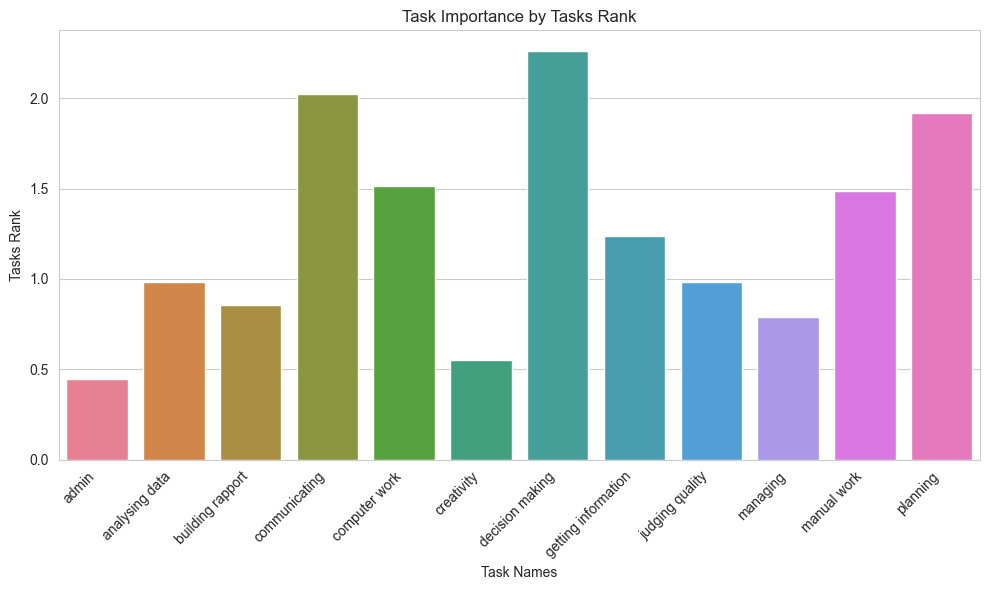

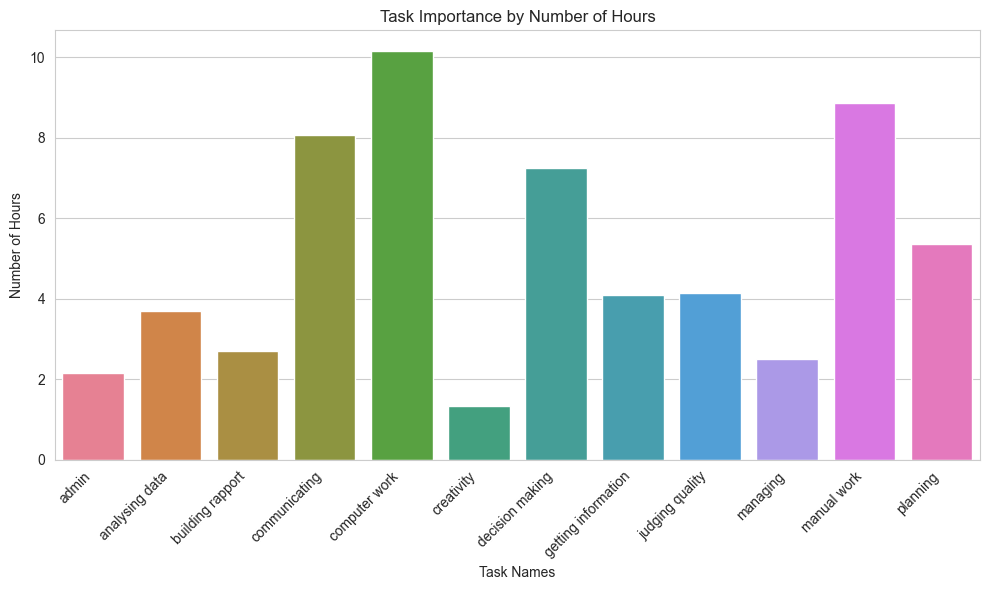

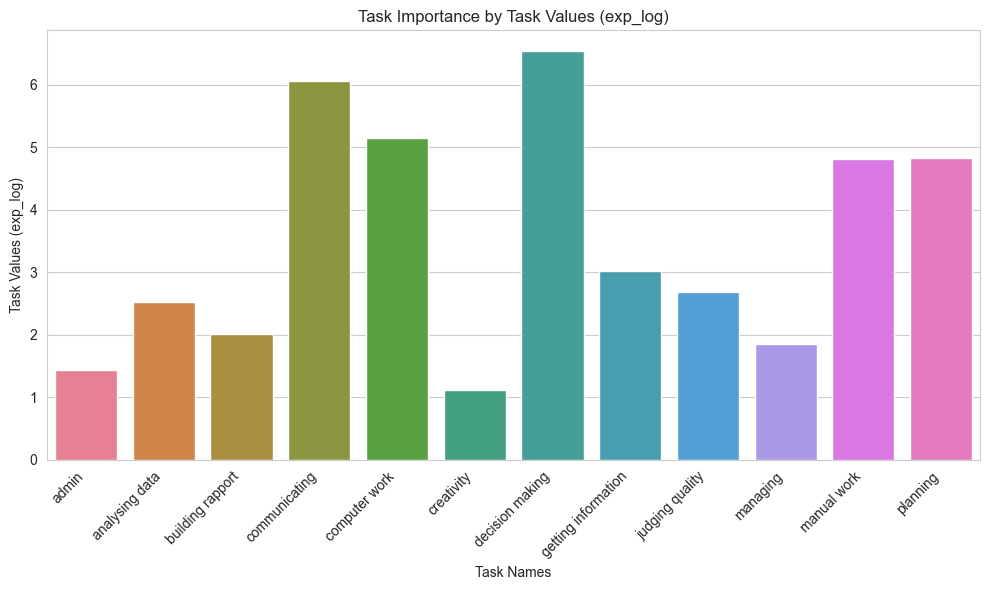

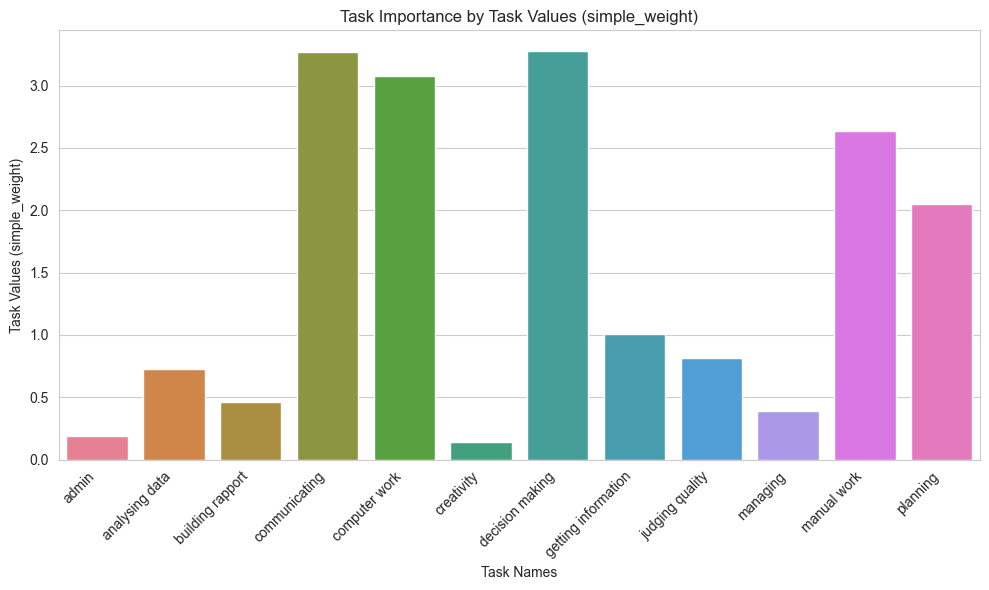

In [32]:
for col in ['task_rank_mean','task_hours_mean','task_value_exp_log','task_value_simple_weight']:

    if col == 'task_rank_mean':
        title = 'Tasks Rank'
    elif col == 'task_hours_mean':
        title = 'Number of Hours'
    elif col == 'task_value_exp_log':
        title = 'Task Values (exp_log)'
    else:
        title = 'Task Values (simple_weight)'

    plt.figure(figsize=(10, 6))

    #sns.barplot(x='TaskName_map', y='InvertedTaskRank', data=data_tasks_melted, errorbar='se',hue='TaskName_map')
    sns.barplot(x='TaskName_map', y=col, data=total_rankings, hue='TaskName_map', errorbar=None)
    # Set labels and title
    plt.xlabel('Task Names')
    plt.ylabel(f'{title}')
    plt.title(f'Task Importance by {title}')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

    # Show the plot
    plt.tight_layout()
    plt.show()

In [33]:
task_stats_d['division_map_new_line'] = task_stats_d['division_map'].str.replace(r':\s*', ':\n', regex=True)

### Sankey plots

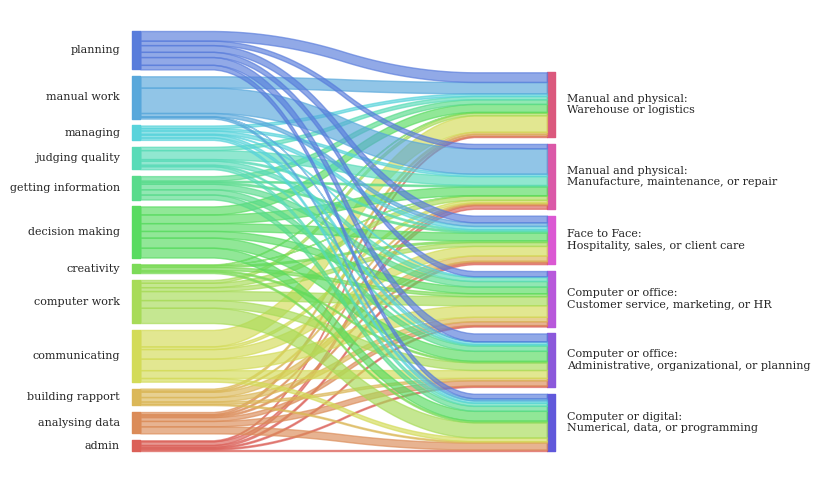

In [40]:
sankey(
    left=task_stats_d["TaskName_map"], right=task_stats_d["division_map_new_line"],
    leftWeight= task_stats_d["task_value_exp_log"], rightWeight=task_stats_d["task_value_exp_log"],
    aspect=20, fontsize=8
)

In [41]:
task_stats_d.groupby('TaskName_map')['task_value_exp_log'].sum()

TaskName_map
admin                   8.274763
analysing data         16.491837
building rapport       12.791043
communicating          39.947716
computer work          33.252091
creativity              6.685217
decision making        39.449946
getting information    18.072805
judging quality        17.332890
managing               11.112076
manual work            32.658202
planning               29.643885
Name: task_value_exp_log, dtype: float64

In [42]:
import pandas as pd
import plotly.graph_objects as go

# Prepare the data for the Sankey diagram
source = task_stats_d['TaskName_map']  # Source of the flow (tasks)
target = task_stats_d['division_map']  # Target of the flow (divisions)
value = task_stats_d['task_value_exp_log']  # Weight of the flow

# Create a list of unique labels (tasks + divisions)
all_labels = list(pd.concat([source, target]).unique())

# Map the labels to indices for Sankey
source_indices = [all_labels.index(task) for task in source]
target_indices = [all_labels.index(div) for div in target]

task_colors = ['rgba(31, 119, 180, 0.8)', 'rgba(255, 127, 14, 0.8)', 'rgba(44, 160, 44, 0.8)',
          'rgba(214, 39, 40, 0.8)', 'rgba(148, 103, 189, 0.8)', 'rgba(140, 86, 75, 0.8)'] * len(source)

# Create a dictionary to match each task to a color
task_color_map = {task: color for task, color in zip(source.unique(), task_colors[:len(source.unique())])}

# Assign link colors based on the source (task) color
link_colors = [task_color_map[task] for task in source]


# Create the Sankey diagram
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=all_labels,
        color=[task_color_map.get(task, "rgba(0,0,0,0.4)") for task in all_labels]
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=value,
        color=link_colors
    )
))

# Update layout and display the plot
fig.update_layout(
    title_text="Sankey Diagram of Tasks and Divisions (Sorted by Task Size)",
    font_size=15,
    width=1200,   # Increase width
    height=800    # Increase height
)
fig.show()


In [43]:
task_stats_d

,division_map,TaskName_map,sum_rank,sum_hours,total_people,task_rank_mean,task_hours_mean,division_map_new_line,task_value_exp_log,task_value_simple_weight
0,"Computer or digital: Numerical, data, or progr...",admin,11.0,35.0,24,0.458333,1.458333,"Computer or digital:\nNumerical, data, or prog...",1.131147,0.133681
1,"Computer or digital: Numerical, data, or progr...",analysing data,46.0,170.0,24,1.916667,7.083333,"Computer or digital:\nNumerical, data, or prog...",5.448846,2.715278
2,"Computer or digital: Numerical, data, or progr...",building rapport,9.0,29.0,24,0.375000,1.208333,"Computer or digital:\nNumerical, data, or prog...",0.955622,0.090625
3,"Computer or digital: Numerical, data, or progr...",communicating,28.0,93.5,24,1.166667,3.895833,"Computer or digital:\nNumerical, data, or prog...",2.846388,0.909028
4,"Computer or digital: Numerical, data, or progr...",computer work,66.0,449.5,24,2.750000,18.729167,"Computer or digital:\nNumerical, data, or prog...",11.794427,10.301042
...,...,...,...,...,...,...,...,...,...,...
66,Manual and physical: Warehouse or logistics,getting information,25.0,113.0,20,1.250000,5.650000,Manual and physical:\nWarehouse or logistics,3.539610,1.412500
67,Manual and physical: Warehouse or logistics,judging quality,12.0,116.0,20,0.600000,5.800000,Manual and physical:\nWarehouse or logistics,2.587575,0.696000
68,Manual and physical: Warehouse or logistics,managing,16.0,58.0,20,0.800000,2.900000,Manual and physical:\nWarehouse or logistics,2.030338,0.464000
69,Manual and physical: Warehouse or logistics,manual work,46.0,300.0,20,2.300000,15.000000,Manual and physical:\nWarehouse or logistics,8.756370,6.900000


In [44]:
import pandas as pd
import plotly.graph_objects as go



# Prepare the data for the first Sankey diagram layer
source_1 = task_stats_d['division_map_new_line']  # Source of the first flow (tasks)
target_1 = task_stats_d['TaskName_map']  # Target of the first flow (divisions)
value_1 = task_stats_d['task_value_exp_log']  # Weight of the first flow

# Prepare the data for the second Sankey diagram layer
source_2 = task_stats_d['TaskName_map']  # Source of the second flow (divisions)
target_2 = task_stats_d['division_map']  # Target of the second flow (back to tasks)
value_2 = task_stats_d['task_rank_mean']  # Weight of the second flow (task_rank_mean)

# Create a list of unique labels (tasks + divisions) for both flows
all_labels = list(pd.concat([source_1, target_1, target_2]).unique())

# Map the labels to indices for the Sankey diagram
source_1_indices = [all_labels.index(task) for task in source_1]
target_1_indices = [all_labels.index(div) for div in target_1]

source_2_indices = [all_labels.index(div) for div in source_2]
target_2_indices = [all_labels.index(task) for task in target_2]

# Combine the two sets of indices and values
source_indices = source_1_indices + source_2_indices
target_indices = target_1_indices + target_2_indices
values = list(value_1) + list(value_2)

# Assign colors to the first set of nodes (TaskName_map)
task_colors = ['rgba(31, 119, 180, 0.8)', 'rgba(255, 127, 14, 0.8)', 'rgba(44, 160, 44, 0.8)',
               'rgba(214, 39, 40, 0.8)', 'rgba(148, 103, 189, 0.8)', 'rgba(140, 86, 75, 0.8)'] * len(source_1)

# Create a dictionary to match each task to a color
task_color_map = {task: color for task, color in zip(source_1.unique(), task_colors[:len(source_1.unique())])}

# Assign link colors based on the source (task) color for the first layer
link_colors = [task_color_map[task] for task in source_1]

# Extend link colors for the second layer (from division to task based on the same division color)
division_color_map = {div: task_color_map.get(task, "rgba(0,0,0,0.4)") for div, task in zip(source_2, target_2)}
link_colors += [division_color_map[div] for div in source_2]

# Create the Sankey diagram with both layers
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=all_labels,
        color=[task_color_map.get(task, "rgba(0,0,0,0.4)") for task in all_labels]
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=link_colors  # Assigning colors to links for both layers
    )
))

# Update layout with larger plot size
fig.update_layout(
    title_text="Multi-Level Sankey Diagram (Task-Value -> Division -> Task-Rank)",
    font_size=10,
    width=1200,   # Increase width
    height=800    # Increase height
)

# Display the plot
fig.show()


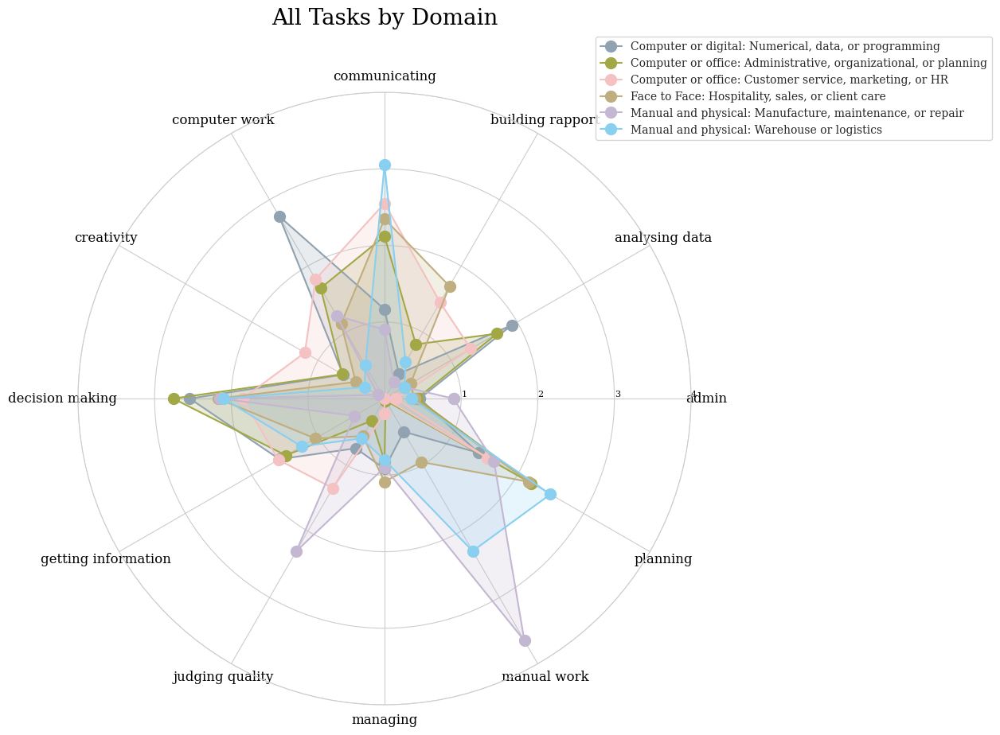

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

# Prepare the data for the radar chart
def prepare_spider_data(df):
    # Get the unique task names and domains
    categories = list(df['TaskName_map'].unique())
    N = len(categories)

    # Compute the angle for each category on the radar chart
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]  # Complete the loop

    return categories, angles

# Create the radar chart for all domains
def make_spider_plot_all(df, categories, angles):
    # Initialize the spider plot
    plt.figure(figsize=(10, 10))
    ax = plt.subplot(111, polar=True)

    # Draw one axe per variable and add labels
    plt.xticks(angles[:-1], categories, color='black', size=12)

    # Draw y-labels
    ax.set_rlabel_position(0)
    plt.yticks([1, 2, 3, 4, 5], ["1", "2", "3", "4", "5"], color="black", size=8)
    plt.ylim(0, 4)

    # Define a color palette for the divisions
    colors = ['#91A3B0', '#A3A847', '#F4C2C2', '#BFAF80', '#C4B7D1', '#89CFF0']

    # Loop through each division and plot its data
    for i, division in enumerate(df['division_map'].unique()):
        division_data = df[df['division_map'] == division]

        division_data = division_data.set_index('TaskName_map').reindex(categories).fillna(0).reset_index()
        values = division_data['task_rank_mean'].values.flatten().tolist()
        values += values[:1]  # Complete the loop

        # Plot each domain with a different color
        ax.plot(angles, values, color=colors[i % len(colors)], linewidth=1.5, linestyle='solid', label=division,
                marker='o', markersize=10)
        ax.fill(angles, values, color=colors[i % len(colors)], alpha=0.2)

    # Add a title and a legend
    plt.title('All Tasks by Domain', size=20, color='black', y=1.1)
    plt.legend(loc='upper right', bbox_to_anchor=(1.5, 1.1))

# Prepare the data for the radar chart
categories, angles = prepare_spider_data(task_stats_d)

# Plot the radar chart for all domains
make_spider_plot_all(task_stats_d, categories, angles)

# Show the plot
plt.show()

### Task value

,sum_rank,sum_hours,task_rank_mean,task_hours_mean,task_value_exp_log,task_value_simple_weight
TaskName_map,,,,,,
admin,62.0,285.50,0.442857,2.039286,1.387147,0.180622
analysing data,149.0,540.00,1.064286,3.857143,2.690838,0.821020
building rapport,120.0,373.00,0.857143,2.664286,1.993484,0.456735
communicating,282.0,1104.00,2.014286,7.885714,5.980502,3.176816
computer work,218.0,1465.50,1.557143,10.467857,5.314209,3.259990
creativity,78.0,187.00,0.557143,1.335714,1.120832,0.148837
decision making,324.0,998.25,2.314286,7.130357,6.665767,3.300337
getting information,177.0,590.00,1.264286,4.214286,3.107342,1.065612
judging quality,127.0,537.00,0.907143,3.835714,2.480549,0.695908


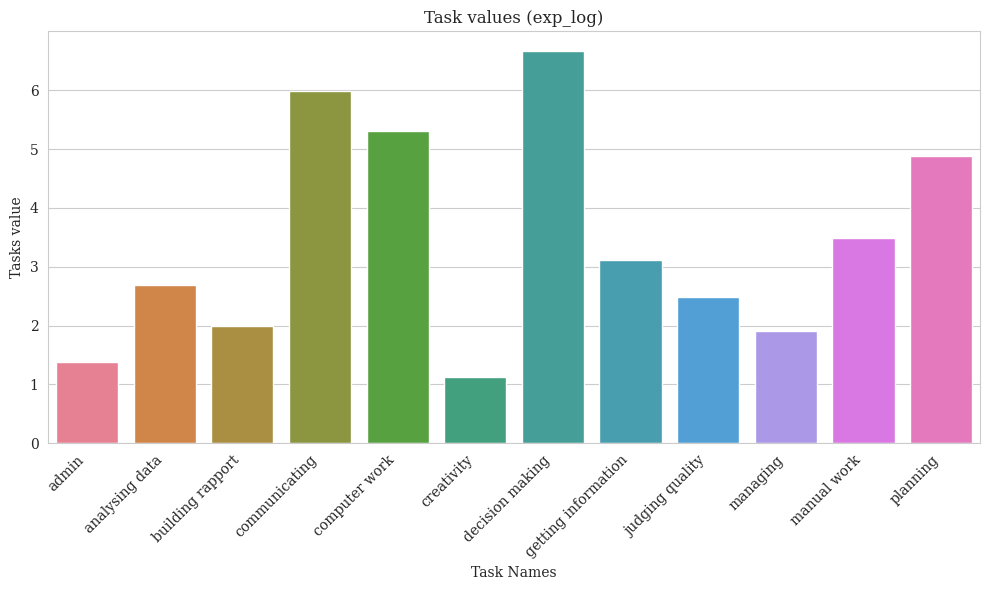

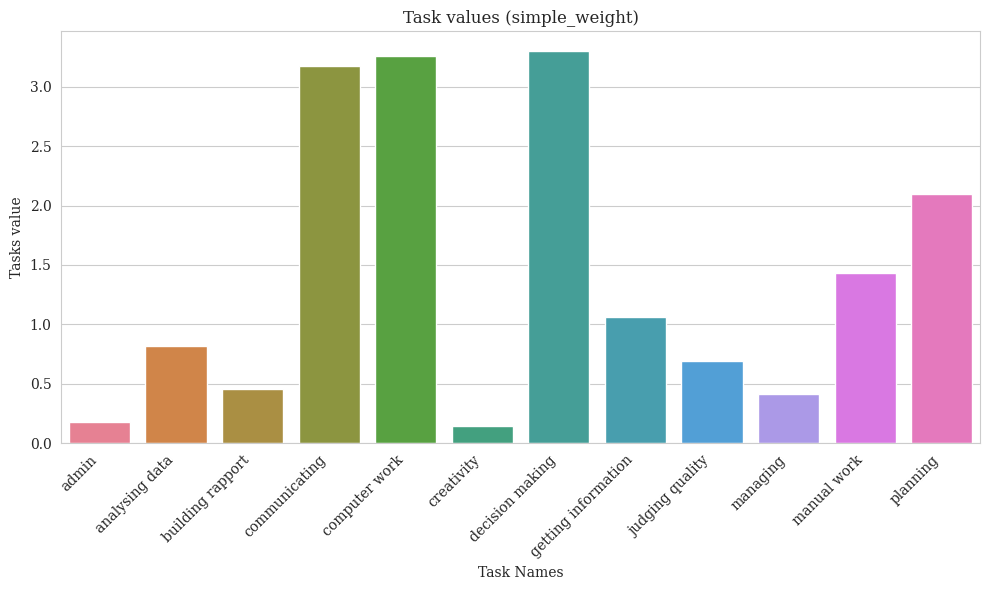

In [46]:
alpha = .5
# Define a function to calculate Task Value
def calculate_task_value_exp_log(importance, hours_spent,alpha):
    return np.exp(alpha*importance) * np.log(1 + hours_spent)

def calculate_task_value_simple_weight(importance, hours_spent):
    return (importance / 5) * hours_spent

task_stats['task_value_exp_log'] = calculate_task_value_exp_log(task_stats['task_rank_mean'], task_stats['task_hours_mean'], alpha)

task_stats['task_value_simple_weight'] = calculate_task_value_simple_weight(task_stats['task_rank_mean'], task_stats['task_hours_mean'])

display(task_stats)

for task_value_name in ['task_value_exp_log','task_value_simple_weight']:

    task_value_clean = task_value_name.split('task_value_')[1]

    plt.figure(figsize=(10, 6))

    #sns.barplot(x='TaskName_map', y='InvertedTaskRank', data=data_tasks_melted, errorbar='se',hue='TaskName_map')
    sns.barplot(x='TaskName_map', y=task_value_name, data=task_stats, hue='TaskName_map', errorbar=None)
    # Set labels and title
    plt.xlabel('Task Names')
    plt.ylabel('Tasks value')
    plt.title(f'Task values ({task_value_clean})')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

    # Show the plot
    plt.tight_layout()
    plt.show()

NOTES:
- top5 for all domains by task value: decision-making, communicating, computer work, planning, and manual work

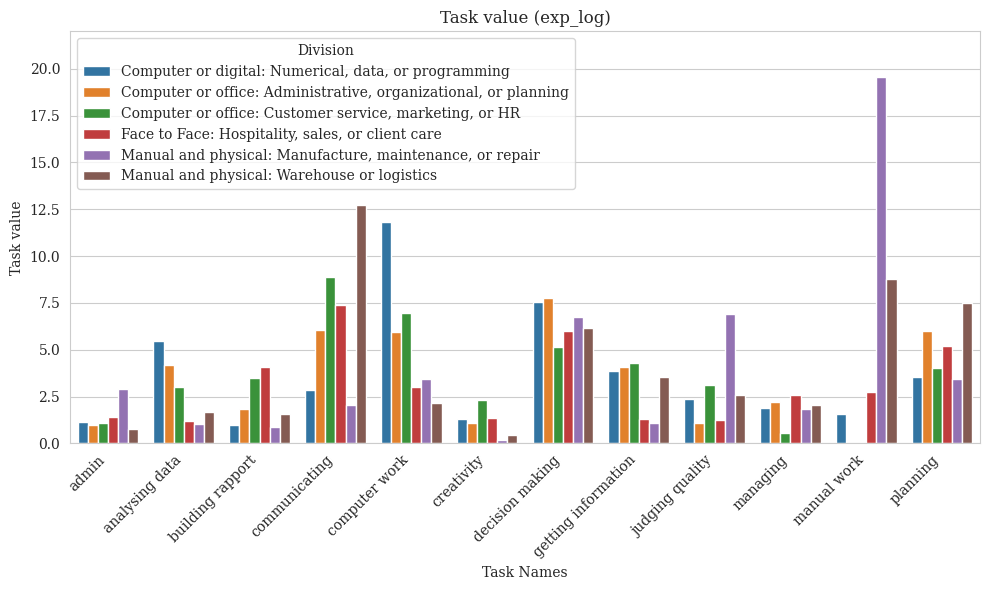

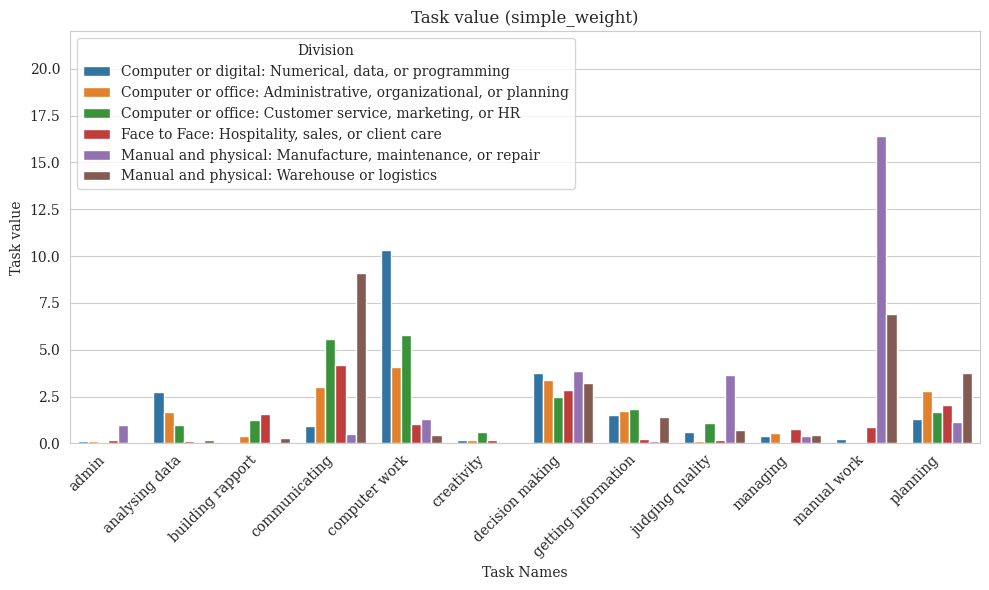

In [47]:
task_stats_d['task_value_exp_log'] = calculate_task_value_exp_log(task_stats_d['task_rank_mean'], task_stats_d['task_hours_mean'], alpha)

task_stats_d['task_value_simple_weight'] = calculate_task_value_simple_weight(task_stats_d['task_rank_mean'], task_stats_d['task_hours_mean'])

for task_value_name in ['task_value_exp_log','task_value_simple_weight']:

    task_value_clean = task_value_name.split('task_value_')[1]

    plt.figure(figsize=(10, 6))

    sns.barplot(x='TaskName_map', y=task_value_name, data=task_stats_d, hue='division_map', errorbar=None)
    # Set labels and title
    plt.xlabel('Task Names')
    plt.ylabel('Task value')
    plt.title(f'Task value ({task_value_clean})')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.legend(title='Division', loc='upper left')
    plt.ylim(0, 22)

    # Show the plot
    plt.tight_layout()
    plt.show()

In [48]:
task_stats_d_sorted_simple_weight = task_stats_d.sort_values(by='task_value_simple_weight', ascending=False)
task_stats_d_sorted_log_exp = task_stats_d.sort_values(by='task_value_exp_log', ascending=False)

# Group by 'division' and get the top 5 tasks for each division
top_5_tasks_per_division_simple_weight = task_stats_d_sorted_simple_weight.groupby('division_map').head(5)
top_5_tasks_per_division_log_exp = task_stats_d_sorted_log_exp.groupby('division_map').head(5)
top_5_tasks_per_division_log_exp

,division_map,TaskName_map,sum_rank,sum_hours,total_people,task_rank_mean,task_hours_mean,division_map_new_line,task_value_exp_log,task_value_simple_weight
57,"Manual and physical: Manufacture, maintenance,...",manual work,73.0,449.00,20,3.650000,22.450000,"Manual and physical:\nManufacture, maintenance...",19.569015,16.388500
62,Manual and physical: Warehouse or logistics,communicating,61.0,298.00,20,3.050000,14.900000,Manual and physical:\nWarehouse or logistics,12.711633,9.089000
4,"Computer or digital: Numerical, data, or progr...",computer work,66.0,449.50,24,2.750000,18.729167,"Computer or digital:\nNumerical, data, or prog...",11.794427,10.301042
27,"Computer or office: Customer service, marketin...",communicating,51.0,219.00,20,2.550000,10.950000,"Computer or office:\nCustomer service, marketi...",8.877797,5.584500
69,Manual and physical: Warehouse or logistics,manual work,46.0,300.00,20,2.300000,15.000000,Manual and physical:\nWarehouse or logistics,8.756370,6.900000
18,"Computer or office: Administrative, organizati...",decision making,91.0,201.50,33,2.757576,6.106061,"Computer or office:\nAdministrative, organizat...",7.785133,3.367585
6,"Computer or digital: Numerical, data, or progr...",decision making,61.0,176.75,24,2.541667,7.364583,"Computer or digital:\nNumerical, data, or prog...",7.569579,3.743663
70,Manual and physical: Warehouse or logistics,planning,50.0,150.00,20,2.500000,7.500000,Manual and physical:\nWarehouse or logistics,7.469565,3.750000
38,"Face to Face: Hospitality, sales, or client care",communicating,54.0,204.00,23,2.347826,8.869565,"Face to Face:\nHospitality, sales, or client care",7.405531,4.164839
28,"Computer or office: Customer service, marketin...",computer work,36.0,320.00,20,1.800000,16.000000,"Computer or office:\nCustomer service, marketi...",6.968580,5.760000


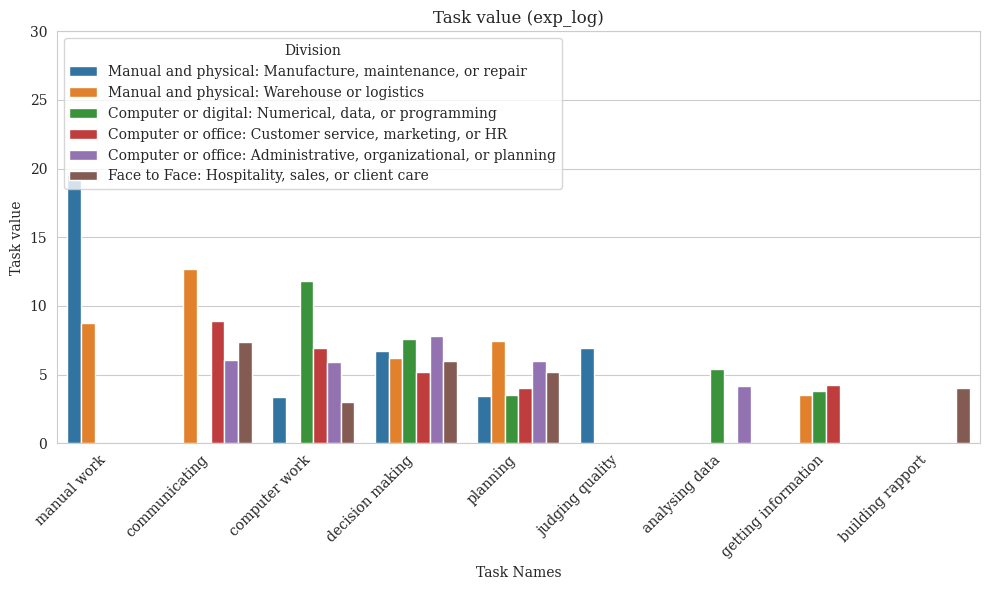

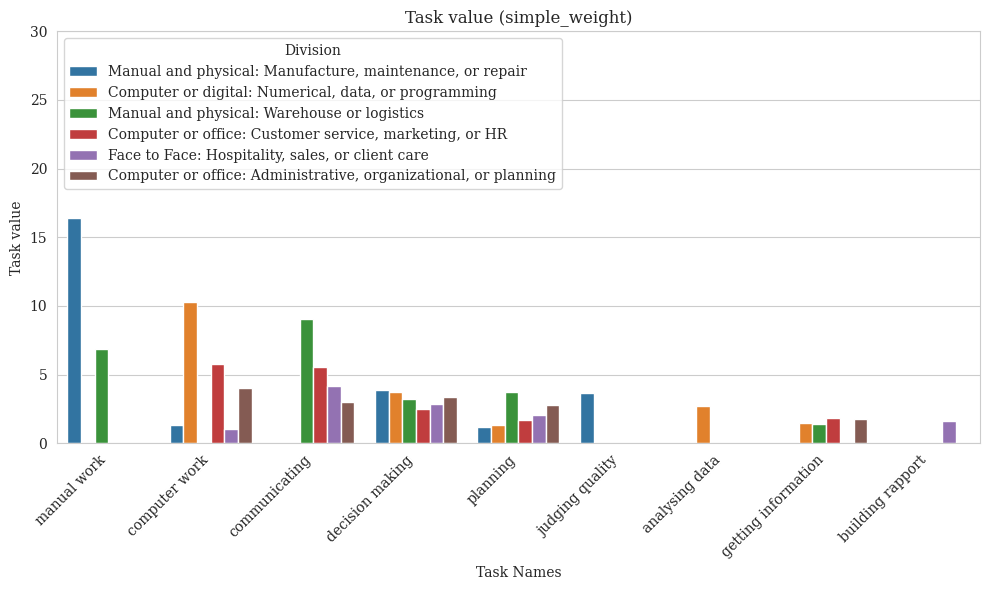

In [49]:
for task_value_name in ['task_value_exp_log','task_value_simple_weight']:

    task_value_clean = task_value_name.split('task_value_')[1]

    if task_value_name == 'task_value_exp_log':
        title = 'Tasks Rank'
        df = top_5_tasks_per_division_log_exp
    else:
        title = 'task_value_simple_weight'
        df = top_5_tasks_per_division_simple_weight

    plt.figure(figsize=(10, 6))

    sns.barplot(x='TaskName_map', y=task_value_name, data=df, hue='division_map', errorbar=None)
    # Set labels and title
    plt.xlabel('Task Names')
    plt.ylabel('Task value')
    plt.title(f'Task value ({task_value_clean})')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.legend(title='Division', loc='upper left')
    plt.ylim(0, 30)

    # Show the plot
    plt.tight_layout()
    plt.show()

NOTES:

- Decision-making and planning in top5 by task value in all domains
- computer work in top5 in all expect: warehouse-logistics
- communicating in top5 in all expect: manufacture and numerical
- getting information in top5 in these domains: warehouse, numerica, customer service (and may administrative)
- manual work in top5 in manufacture and warehouse
- judging quality in top5 just in manufacture
- analysing data in top5 just in numerical (and maybe administrative)
- building rapport in top5 just in face to face

NOTES FROM JUST RANK AND NUMBER OF HOURS

- decision-making and planning top5 in all domains (by rank and num hours)
- computer work in top5 in all apart from warehouse-logistics, but by num hours not in top5 for face to face
- communicating top5 in all apart from manufacture, maintenance and numerical data (by rank and num hours)
- getting information in top5 in warehouse, numerical, customer service (by rank); numerical, customer service, and administrative (by num hours)
- manual work in top5 in manufacture and warehouse (by rank); in addition in face to face (by num hours)
- analysing data in top5 in administrative and numerical (by rank); just numerical (by num hours)
- judging quality only in manufacture (by rank); in addition in warehouse and logistics (by num hours)
- building rapport only in face to face (by both rank and num hours)
- admin in top5 for manufacture by num hours

### Number of hours distribution

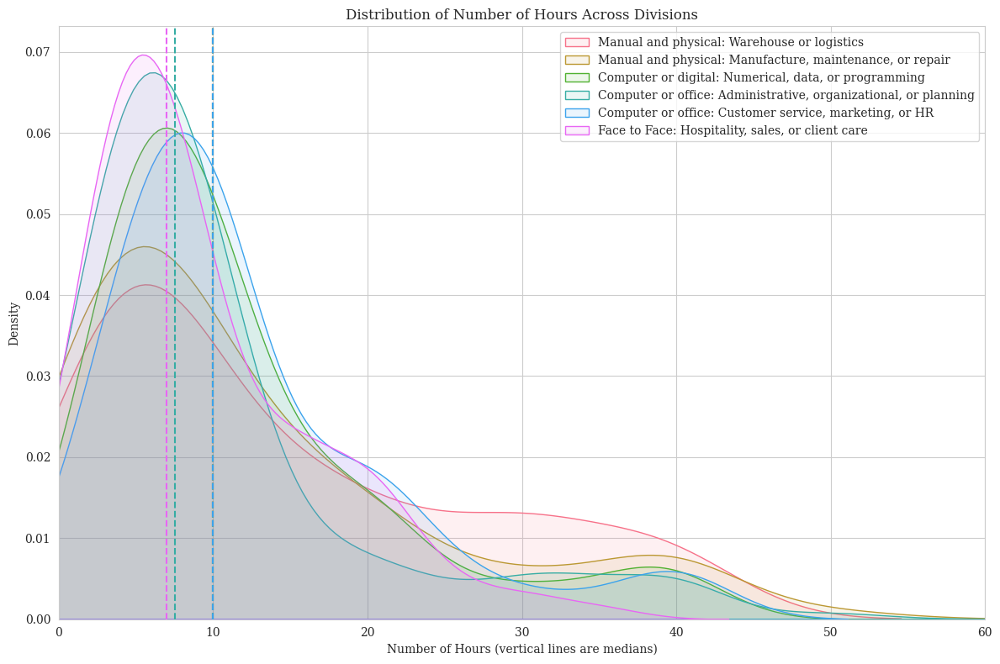

In [50]:
plt.figure(figsize=(12, 8))

palette = sns.color_palette("husl", len(data_tasks_melted['division'].unique()))

# Iterate through each division
for i, division in enumerate(data_tasks_melted['division'].unique()):
    # Subset the data for each division
    division_data = data_tasks_melted[data_tasks_melted['division'] == division]['NumberHours']

    # Plot the distribution
    sns.kdeplot(division_data, label=division_mapping[division], color=palette[i], fill=True, alpha=0.1)
    #sns.histplot(division_data, label=division_mapping[division], kde=False, bins=20, color=palette[i], alpha=0.5)
    # Plot the mean as a vertical line
    plt.axvline(division_data.median(), color=palette[i], linestyle='--')

plt.xlim(left=0,right=60)
plt.xticks(range(0, 61, 10))
plt.xlabel('Number of Hours (vertical lines are medians)')
plt.ylabel('Density')
plt.title('Distribution of Number of Hours Across Divisions')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [51]:
data_tasks_melted.groupby('division_map')['NumberHours'].median()

division_map
Computer or digital: Numerical, data, or programming               10.0
Computer or office: Administrative, organizational, or planning     7.5
Computer or office: Customer service, marketing, or HR             10.0
Face to Face: Hospitality, sales, or client care                    7.0
Manual and physical: Manufacture, maintenance, or repair           10.0
Manual and physical: Warehouse or logistics                        10.0
Name: NumberHours, dtype: float64

### How physical or social are the tasks

From questionnaire:

How physical

"The 5 important job tasks are listed below once again.

This time, imagine performing each task in the context of your job. Use the sliders to rate how "physical" you believe each task to be within your job specifically.

Physical tasks involve dealing with objects in the environment. For example, repairing machines, stacking shelves, and driving vehicles are all highly physical tasks."

How social

"Similar to before, imagine performing each task in the context of your job. Use the sliders to rate how "social" you believe each task to be within your job specifically.

Social tasks involve dealing with people in the environment. For example, serving customers, discussing ideas with colleagues, and caring for patients are all highly social tasks."

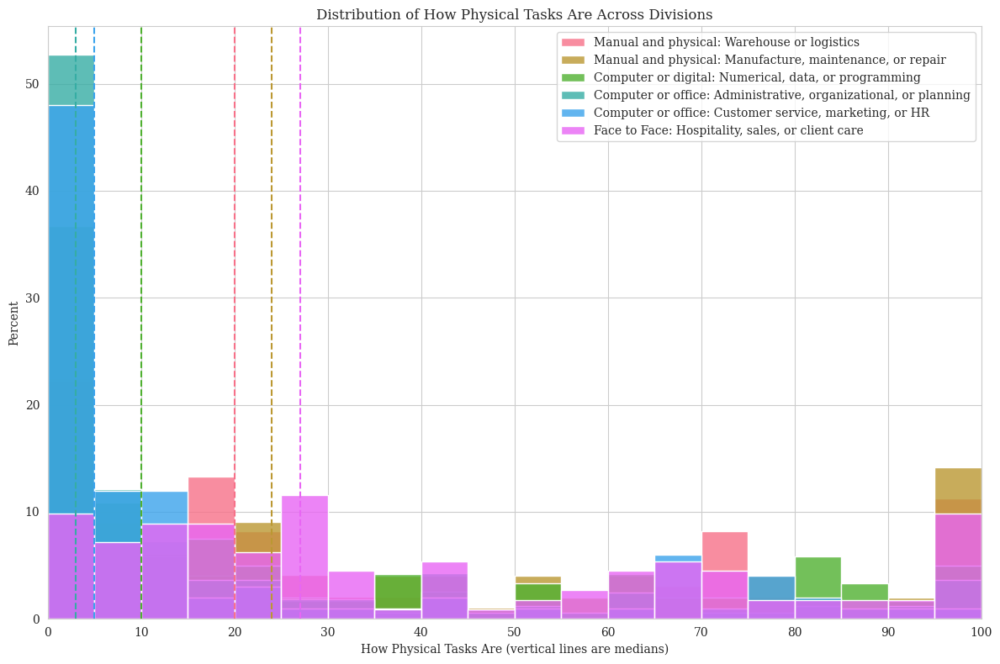

In [52]:
plt.figure(figsize=(12, 8))

palette = sns.color_palette("husl", len(data_tasks_melted['division'].unique()))
bins = np.linspace(0, 100, 21)
# Iterate through each division
for i, division in enumerate(data_tasks_melted['division'].unique()):
    # Subset the data for each division
    division_data = data_tasks_melted[data_tasks_melted['division'] == division]['TaskPhysical']

    # Plot the distribution
    #sns.kdeplot(division_data, label=division_mapping[division], color=palette[i], fill=True, alpha=0.1)
    sns.histplot(division_data, label=division_mapping[division], kde=False, bins=bins, color=palette[i],
                 alpha=0.8,stat='percent')
    #plt.hist(division_data, bins=bins, histtype='stepfilled', label=division_mapping[division],
    #         color=palette[i], alpha=0.8, linewidth=2, density=True)
    # Plot the mean as a vertical line
    plt.axvline(division_data.median(), color=palette[i], linestyle='--')

plt.xlim(left=0,right=100)
plt.xticks(range(0, 101, 10))
plt.xlabel('How Physical Tasks Are (vertical lines are medians)')
plt.ylabel('Percent')
plt.title('Distribution of How Physical Tasks Are Across Divisions')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

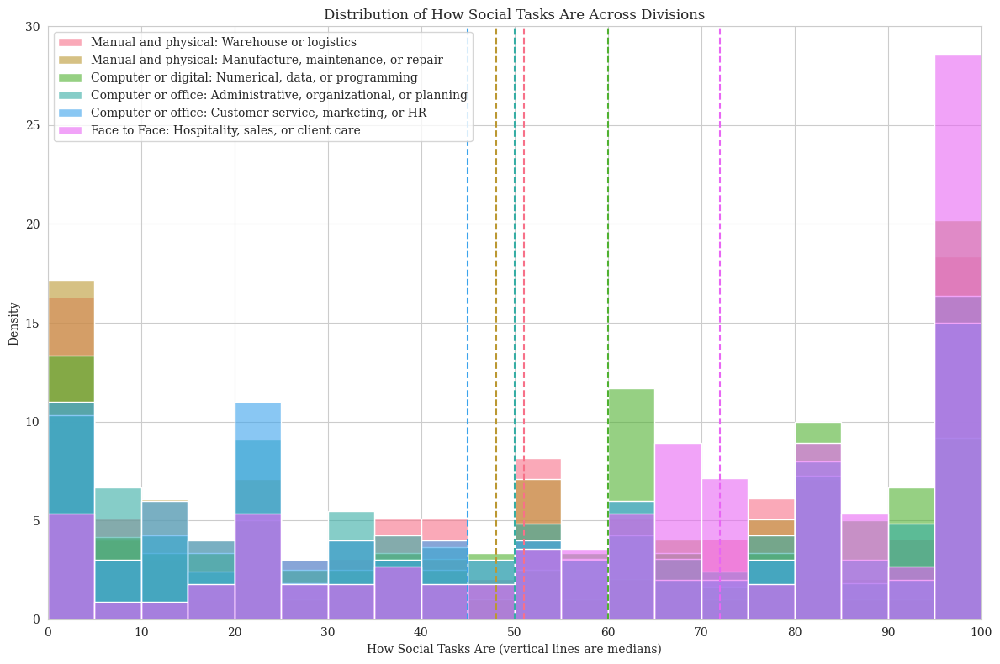

In [53]:
plt.figure(figsize=(12, 8))

palette = sns.color_palette("husl", len(data_tasks_melted['division'].unique()))

# Iterate through each division
for i, division in enumerate(data_tasks_melted['division'].unique()):
    # Subset the data for each division
    division_data = data_tasks_melted[data_tasks_melted['division'] == division]['TaskSocial']

    # Plot the distribution
    #sns.kdeplot(division_data, label=division_mapping[division], color=palette[i], fill=True, alpha=0.1)
    sns.histplot(division_data, label=division_mapping[division], kde=False, bins=bins, color=palette[i],
                 alpha=0.6,stat='percent')
    # Plot the mean as a vertical line
    plt.axvline(division_data.median(), color=palette[i], linestyle='--')

plt.xlim(left=0,right=100)
plt.xticks(range(0, 101, 10))
plt.xlabel('How Social Tasks Are (vertical lines are medians)')
plt.ylabel('Density')
plt.title('Distribution of How Social Tasks Are Across Divisions')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### Correlations

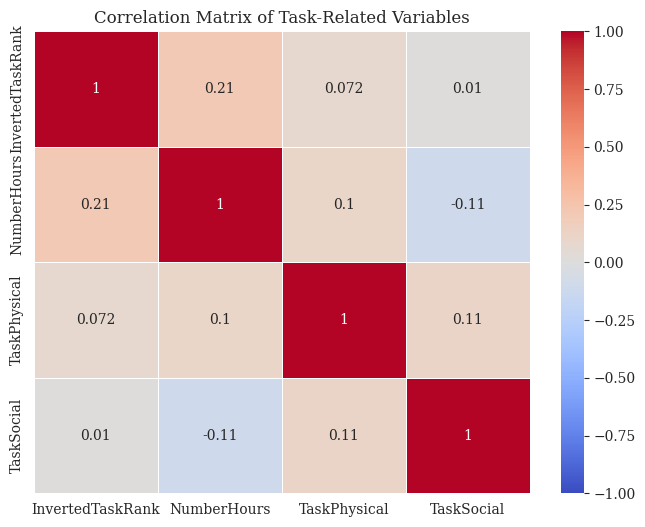

In [54]:
# Select the relevant columns for correlation
columns_for_correlation = ['InvertedTaskRank', 'NumberHours', 'TaskPhysical', 'TaskSocial']
correlation_matrix = data_tasks_melted[columns_for_correlation].corr()

# Plot the heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5, linecolor='white')

# Set plot title
plt.title('Correlation Matrix of Task-Related Variables')

# Show the plot
plt.show()

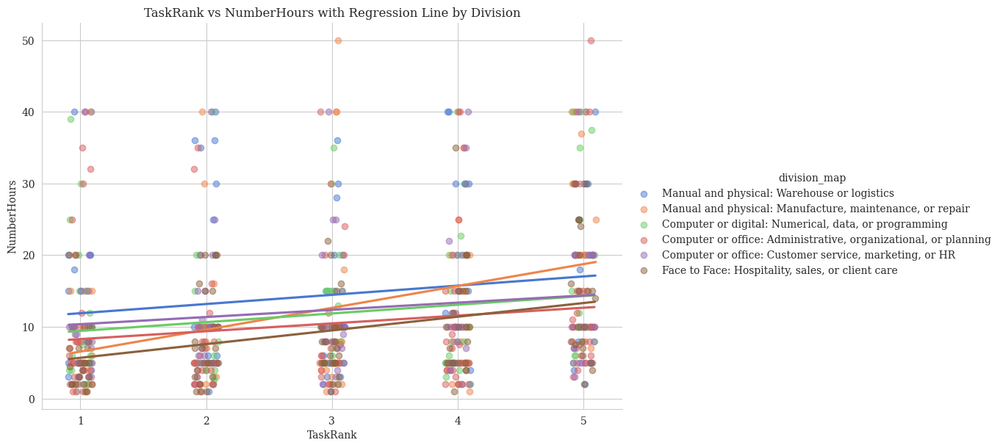

In [55]:
# Create a scatter plot with regression lines for each division
data_tasks_melted['TaskRank_jittered'] = data_tasks_melted['InvertedTaskRank'] + np.random.uniform(-0.1, 0.1, size=len(data_tasks_melted))

sns.lmplot(x='TaskRank_jittered', y='NumberHours', hue='division_map', data=data_tasks_melted,
           aspect=1.5, height=6, markers='o', ci=None, palette='muted',scatter_kws={'alpha': 0.5})

# Set plot title and labels
plt.title('TaskRank vs NumberHours with Regression Line by Division')
plt.xlabel('TaskRank')
plt.ylabel('NumberHours')

# Show the plot
plt.show()

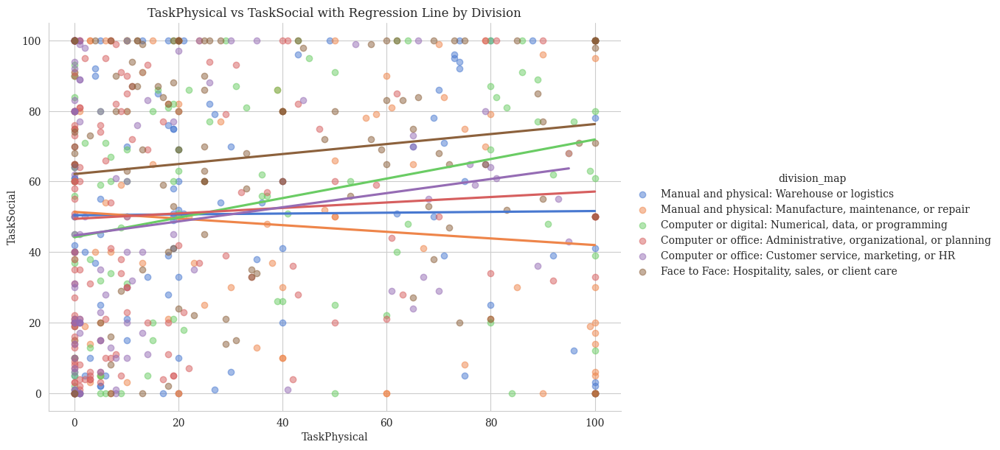

In [56]:
# Create a scatter plot with regression lines for each division
sns.lmplot(x='TaskPhysical', y='TaskSocial', hue='division_map', data=data_tasks_melted,
           aspect=1.5, height=6, markers='o', ci=None, palette='muted',scatter_kws={'alpha': 0.5})

# Set plot title and labels
plt.title('TaskPhysical vs TaskSocial with Regression Line by Division')
plt.xlabel('TaskPhysical')
plt.ylabel('TaskSocial')

# Show the plot
plt.show()

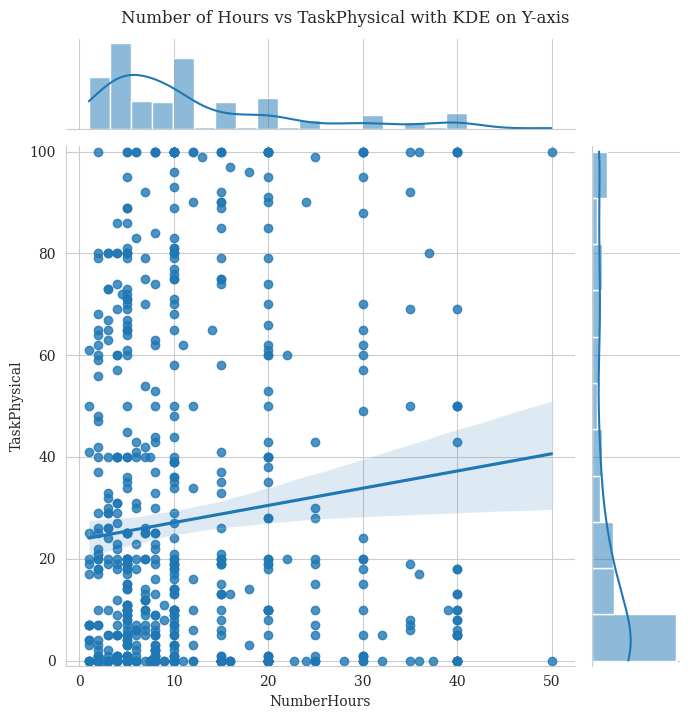

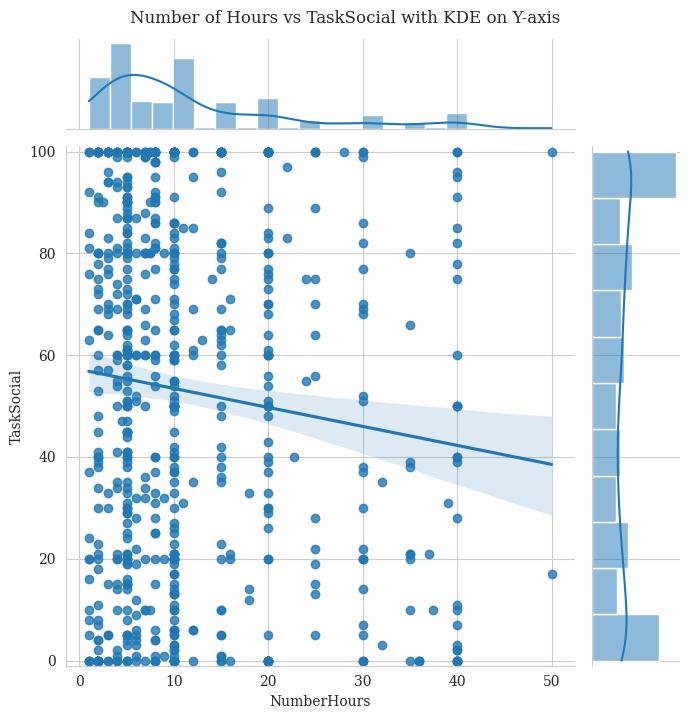

In [57]:
# Create scatter plot with regression line for TaskPhysical vs NumberHours and TaskSocial vs NumberHours
# Jointplot for NumberHours vs TaskPhysical with KDE on the side
sns.jointplot(x='NumberHours', y='TaskPhysical', data=data_tasks_melted,
              kind='reg', marginal_kws=dict(fill=True),
              ylim=(data_tasks_melted['TaskPhysical'].min() - 1, data_tasks_melted['TaskPhysical'].max() + 1),
              height=7)

# Set the title
plt.suptitle('Number of Hours vs TaskPhysical with KDE on Y-axis', y=1.02)
plt.show()

# Jointplot for NumberHours vs TaskSocial with KDE on the side
sns.jointplot(x='NumberHours', y='TaskSocial', data=data_tasks_melted,
              kind='reg', marginal_kws=dict(fill=True),
              ylim=(data_tasks_melted['TaskSocial'].min() - 1, data_tasks_melted['TaskSocial'].max() + 1),
              height=7)

# Set the title
plt.suptitle('Number of Hours vs TaskSocial with KDE on Y-axis', y=1.02)
plt.show()

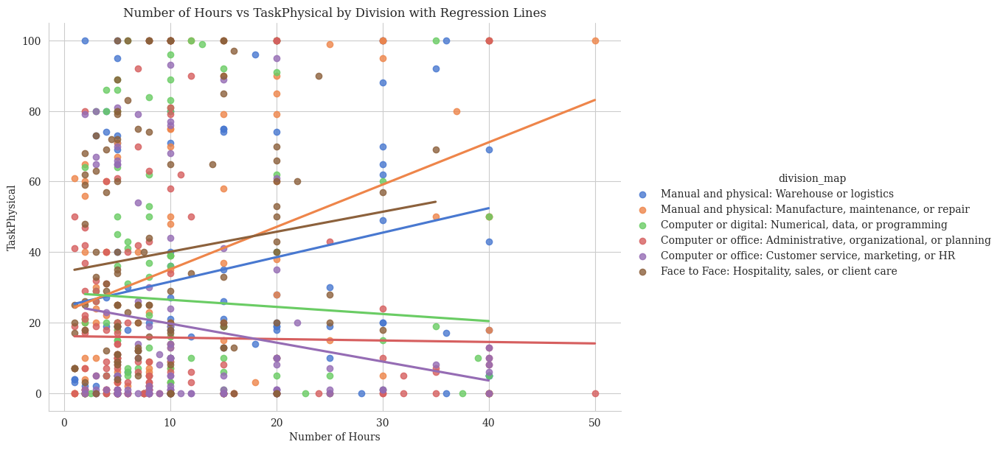

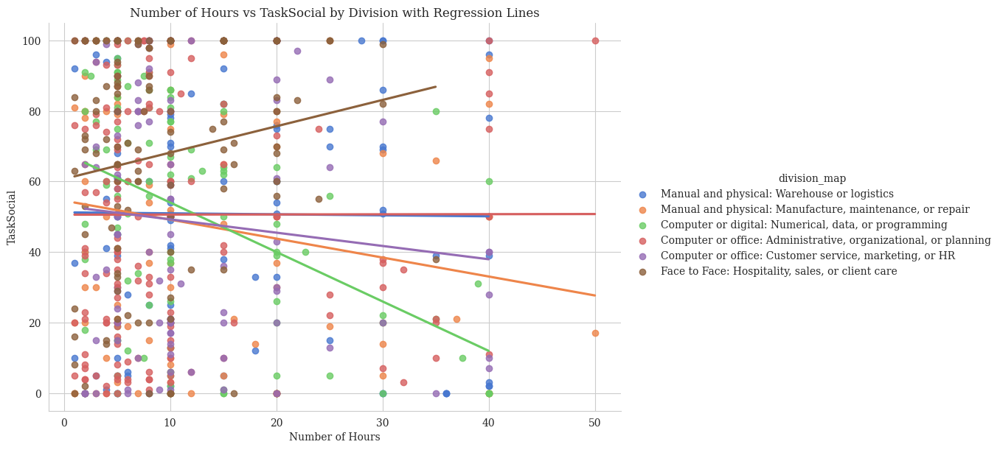

In [58]:
# Create an lmplot to plot NumberHours vs TaskPhysical with regression lines by domain (division_map)
sns.lmplot(x='NumberHours', y='TaskPhysical', hue='division_map', data=data_tasks_melted,
           aspect=1.5, height=6, markers='o', palette='muted', ci=None)

# Set plot labels and title
plt.title('Number of Hours vs TaskPhysical by Division with Regression Lines')
plt.xlabel('Number of Hours')
plt.ylabel('TaskPhysical')

# Show the plot
plt.show()

# Repeat the process for TaskSocial
sns.lmplot(x='NumberHours', y='TaskSocial', hue='division_map', data=data_tasks_melted,
           aspect=1.5, height=6, markers='o', palette='muted', ci=None)

# Set plot labels and title
plt.title('Number of Hours vs TaskSocial by Division with Regression Lines')
plt.xlabel('Number of Hours')
plt.ylabel('TaskSocial')

# Show the plot
plt.show()

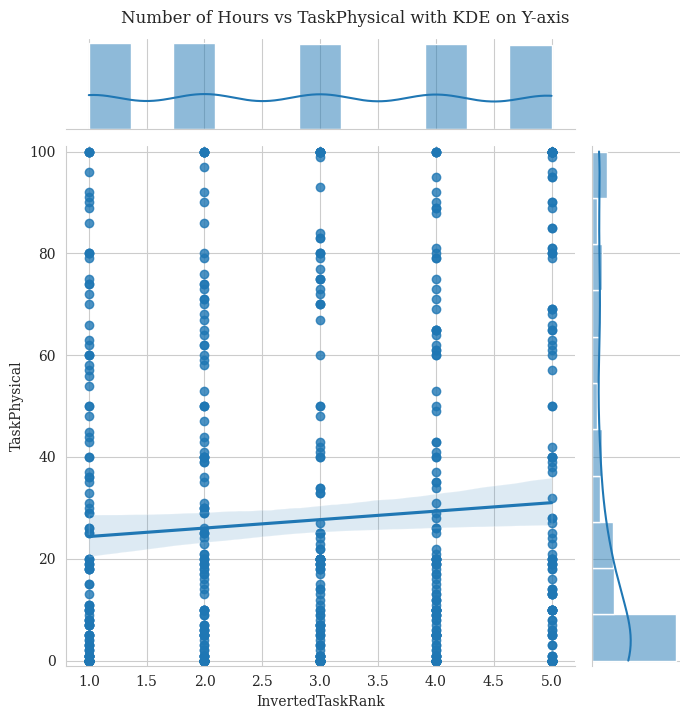

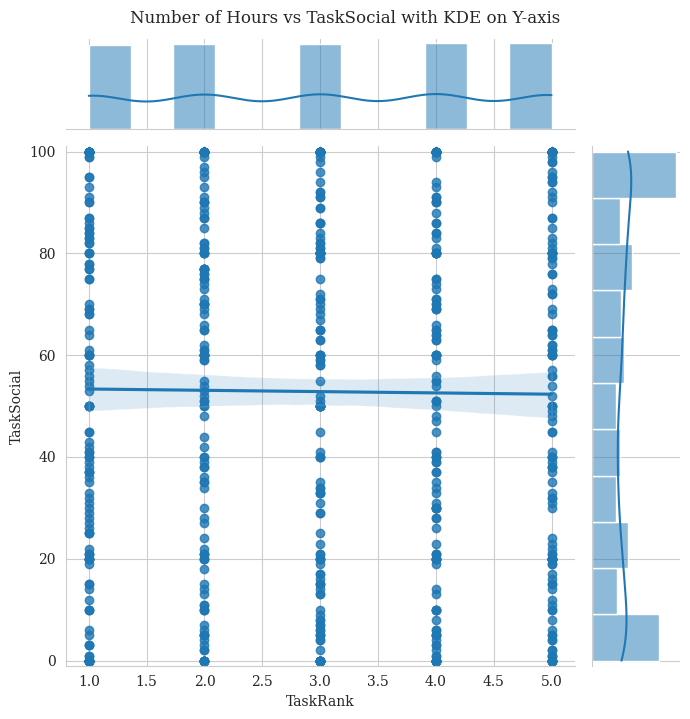

In [59]:
# Create scatter plot with regression line for TaskPhysical vs NumberHours and TaskSocial vs NumberHours
# Jointplot for NumberHours vs TaskPhysical with KDE on the side

sns.jointplot(x='InvertedTaskRank', y='TaskPhysical', data=data_tasks_melted,
              kind='reg', marginal_kws=dict(fill=True),
              ylim=(data_tasks_melted['TaskPhysical'].min() - 1, data_tasks_melted['TaskPhysical'].max() + 1),
              height=7)

# Set the title
plt.suptitle('Number of Hours vs TaskPhysical with KDE on Y-axis', y=1.02)
plt.show()

# Jointplot for NumberHours vs TaskSocial with KDE on the side
sns.jointplot(x='TaskRank', y='TaskSocial', data=data_tasks_melted,
              kind='reg', marginal_kws=dict(fill=True),
              ylim=(data_tasks_melted['TaskSocial'].min() - 1, data_tasks_melted['TaskSocial'].max() + 1),
              height=7)

# Set the title
plt.suptitle('Number of Hours vs TaskSocial with KDE on Y-axis', y=1.02)
plt.show()

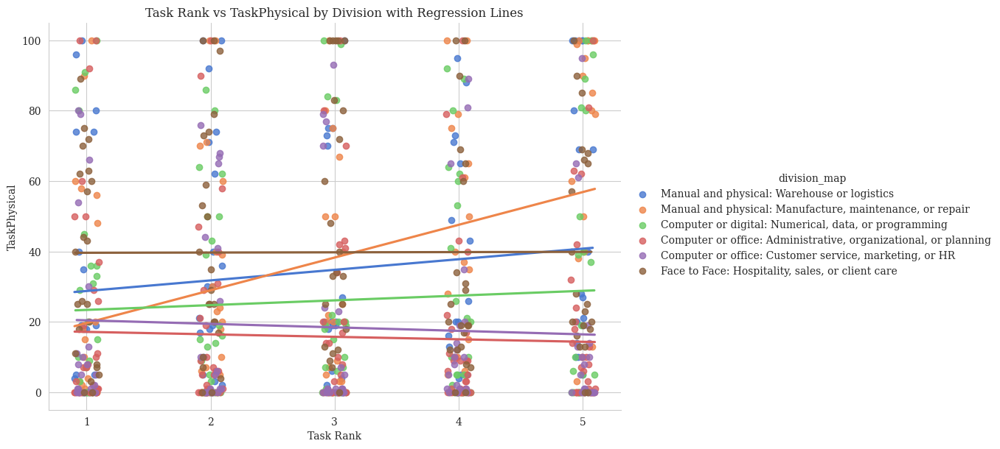

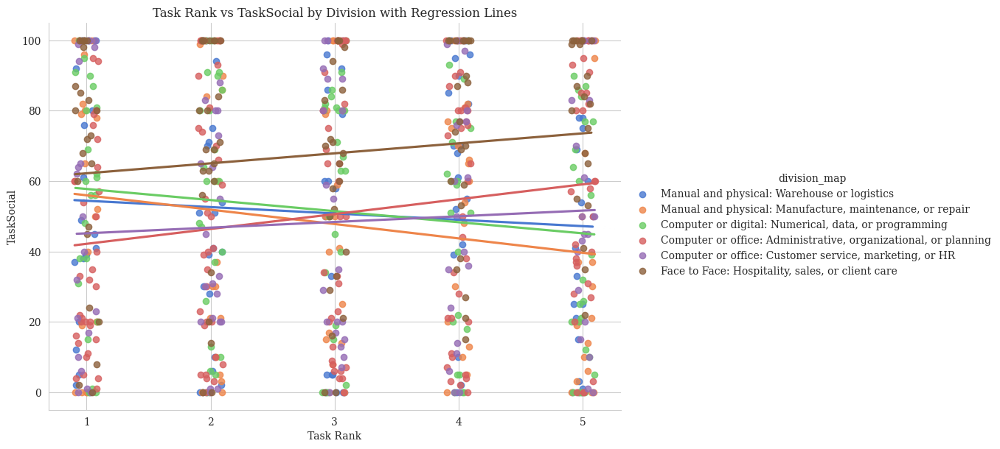

In [60]:
# Create an lmplot to plot NumberHours vs TaskPhysical with regression lines by domain (division_map)

data_tasks_melted['TaskRank_jittered'] = data_tasks_melted['InvertedTaskRank'] + np.random.uniform(-0.1, 0.1, size=len(data_tasks_melted))

sns.lmplot(x='TaskRank_jittered', y='TaskPhysical', hue='division_map', data=data_tasks_melted,
           aspect=1.5, height=6, markers='o', palette='muted', ci=None)

# Set plot labels and title
plt.title('Task Rank vs TaskPhysical by Division with Regression Lines')
plt.xlabel('Task Rank')
plt.ylabel('TaskPhysical')

# Show the plot
plt.show()

# Repeat the process for TaskSocial
sns.lmplot(x='TaskRank_jittered', y='TaskSocial', hue='division_map', data=data_tasks_melted,
           aspect=1.5, height=6, markers='o', palette='muted', ci=None)

# Set plot labels and title
plt.title('Task Rank vs TaskSocial by Division with Regression Lines')
plt.xlabel('Task Rank')
plt.ylabel('TaskSocial')

# Show the plot
plt.show()

In [61]:
domains = ['Domain A', 'Domain B', 'Domain C']
tasks = [f'Task {i}' for i in range(1, 51)]

# Dummy data for importance (1 to 5) and hours spent (1 to 40)
importance = np.random.randint(1, 6, size=50)
hours_spent = np.random.randint(1, 41, size=50)

# Create a dataframe
data_dummy = pd.DataFrame({
    'Task': tasks,
    'Domain': np.random.choice(domains, size=50),
    'Importance': importance,
    'Hours_Spent': hours_spent
})

# Calculate Task Value using the formula: Task Value = (1 / (1 + np.exp(-alpha * (Importance - mu)))) * Hours_Spent
alpha = 0.5
mu = 3  # Mean importance
data_dummy['Task_Value'] = (1 / (1 + np.exp(-alpha * (data_dummy['Importance'] - mu)))) * data_dummy['Hours_Spent']
data_dummy

,Task,Domain,Importance,Hours_Spent,Task_Value
0,Task 1,Domain C,3,34,17.000000
1,Task 2,Domain A,4,10,6.224593
2,Task 3,Domain A,2,7,2.642785
3,Task 4,Domain C,4,17,10.581809
4,Task 5,Domain A,3,11,5.500000
5,Task 6,Domain B,2,23,8.683435
6,Task 7,Domain B,1,31,8.337184
7,Task 8,Domain C,2,28,10.571139
8,Task 9,Domain B,2,17,6.418191
9,Task 10,Domain B,3,35,17.500000


### Contour curves for calculating task value

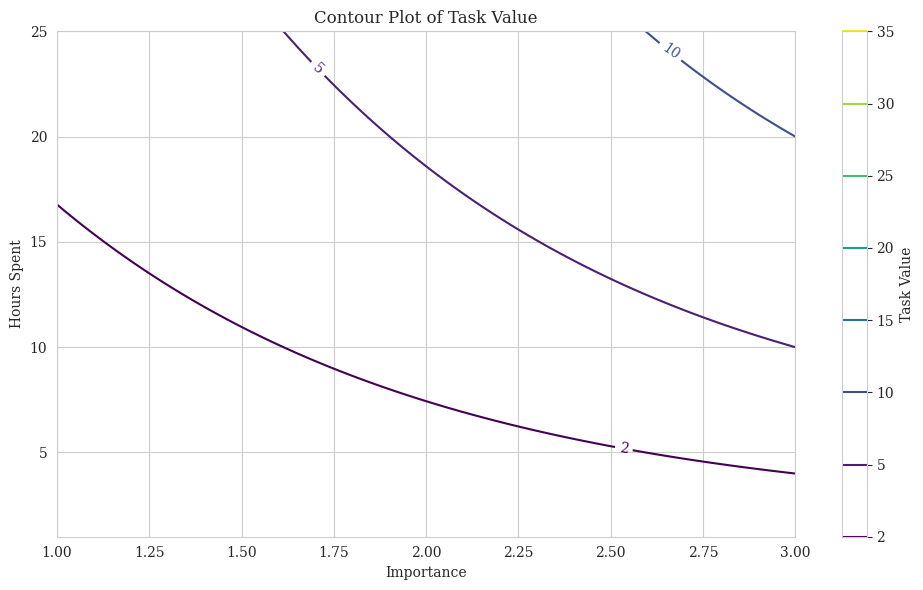

In [62]:
# Create a grid of values for Importance and Hours_Spent
importance_values = np.linspace(1, 3, 100)
hours_spent_values = np.linspace(1, 25, 100)
alpha = 1
mu = 3

# Define a function to calculate Task Value
def calculate_task_value(importance, hours_spent, alpha=0.5, mu=3):
    return (1 / (1 + np.exp(-alpha * (importance - mu)))) * hours_spent

# Create levels of Task_Value to draw contour lines
task_value_levels = [2, 5, 10, 15, 20, 25, 30, 35]  # Example levels of task value

# Create a meshgrid for Importance and Hours_Spent
Importance, Hours_Spent = np.meshgrid(importance_values, hours_spent_values)

# Calculate Task Value for each combination of Importance and Hours_Spent
Task_Value = calculate_task_value(Importance, Hours_Spent, alpha, mu)

# Plot contour lines for constant Task Value
plt.figure(figsize=(10, 6))
contour = plt.contour(Importance, Hours_Spent, Task_Value, levels=task_value_levels, cmap='viridis')
plt.clabel(contour, inline=True, fontsize=10, fmt="%.0f")
plt.xlabel('Importance')
plt.ylabel('Hours Spent')
plt.title('Contour Plot of Task Value')
plt.colorbar(contour, label='Task Value')

plt.tight_layout()
plt.show()


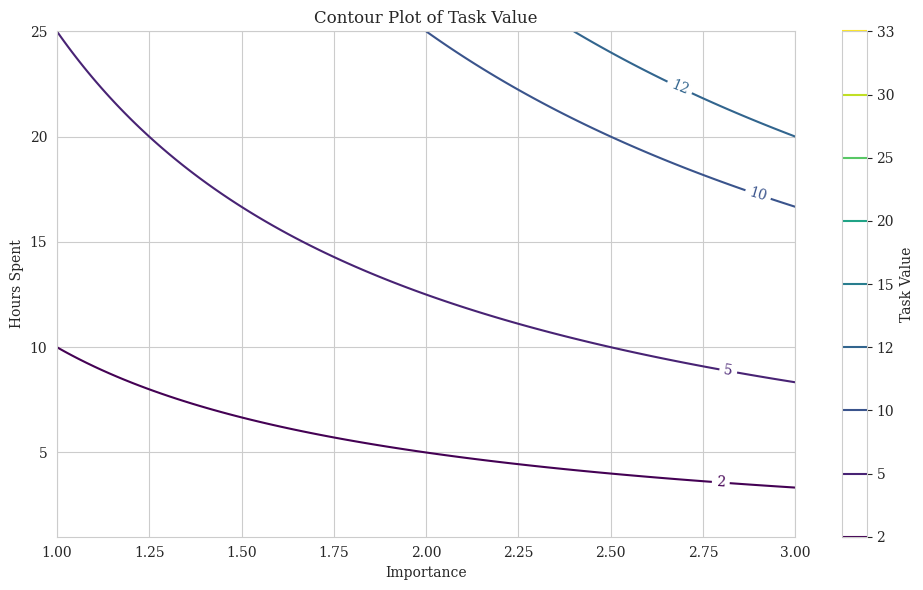

In [63]:
# Create a grid of values for Importance and Hours_Spent
importance_values = np.linspace(1, 3, 100)
hours_spent_values = np.linspace(1, 25, 100)
alpha = 1
mu = 3

# Define a function to calculate Task Value
def calculate_task_value(importance, hours_spent):
    return (importance / 5) * hours_spent

# Create levels of Task_Value to draw contour lines
task_value_levels = [2, 5, 10, 12, 15, 20, 25, 30, 33]  # Example levels of task value

# Create a meshgrid for Importance and Hours_Spent
Importance, Hours_Spent = np.meshgrid(importance_values, hours_spent_values)

# Calculate Task Value for each combination of Importance and Hours_Spent
Task_Value = calculate_task_value(Importance, Hours_Spent)

# Plot contour lines for constant Task Value
plt.figure(figsize=(10, 6))
contour = plt.contour(Importance, Hours_Spent, Task_Value, levels=task_value_levels, cmap='viridis')
plt.clabel(contour, inline=True, fontsize=10, fmt="%.0f")
plt.xlabel('Importance')
plt.ylabel('Hours Spent')
plt.title('Contour Plot of Task Value')
plt.colorbar(contour, label='Task Value')

plt.tight_layout()
plt.show()


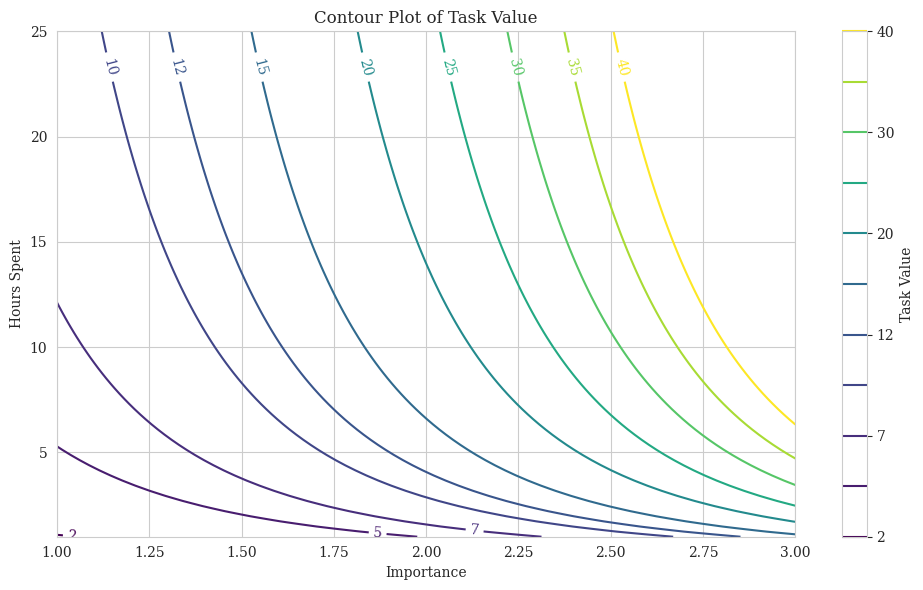

In [64]:
# Create a grid of values for Importance and Hours_Spent
importance_values = np.linspace(1, 3, 100)
hours_spent_values = np.linspace(1, 25, 100)
alpha = 1

# Define a function to calculate Task Value
def calculate_task_value(importance, hours_spent,alpha):
    return np.exp(alpha*importance) * np.log(1 + hours_spent)

# Create levels of Task_Value to draw contour lines
task_value_levels = [2, 5, 7, 10, 12, 15, 20, 25, 30, 35, 40]  # Example levels of task value

# Create a meshgrid for Importance and Hours_Spent
Importance, Hours_Spent = np.meshgrid(importance_values, hours_spent_values)

# Calculate Task Value for each combination of Importance and Hours_Spent
Task_Value = calculate_task_value(Importance, Hours_Spent,alpha)

# Plot contour lines for constant Task Value
plt.figure(figsize=(10, 6))
contour = plt.contour(Importance, Hours_Spent, Task_Value, levels=task_value_levels, cmap='viridis')
plt.clabel(contour, inline=True, fontsize=10, fmt="%.0f")
plt.xlabel('Importance')
plt.ylabel('Hours Spent')
plt.title('Contour Plot of Task Value')
plt.colorbar(contour, label='Task Value')

plt.tight_layout()
plt.show()


In [65]:
for i in range(1,6):
    print(1 / (1 + np.exp(-1.5 * (i - 3))))

0.04742587317756678
0.18242552380635635
0.5
0.8175744761936437
0.9525741268224334


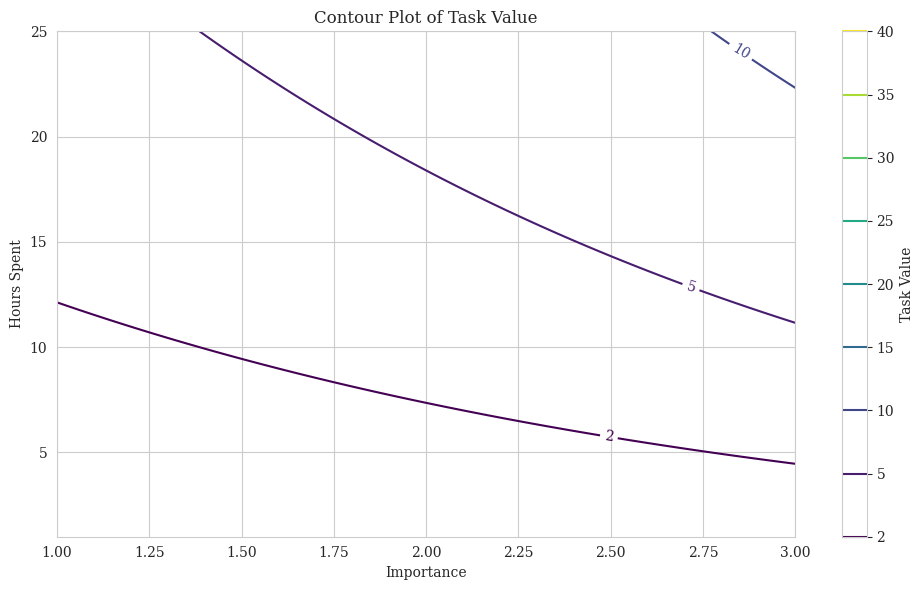

In [66]:
# Create a grid of values for Importance and Hours_Spent
importance_values = np.linspace(1, 3, 100)
hours_spent_values = np.linspace(1, 25, 100)
alpha = 0.5
beta = 0.1


# Define a function to calculate Task Value
def calculate_task_value(importance, hours_spent, alpha, beta):
    return np.exp(alpha * importance) * beta *  hours_spent

# Create levels of Task_Value to draw contour lines
task_value_levels = [2, 5, 10, 15, 20, 25, 30, 35, 40]  # Example levels of task value

# Create a meshgrid for Importance and Hours_Spent
Importance, Hours_Spent = np.meshgrid(importance_values, hours_spent_values)

# Calculate Task Value for each combination of Importance and Hours_Spent
Task_Value = calculate_task_value(Importance, Hours_Spent, alpha, beta)

# Plot contour lines for constant Task Value
plt.figure(figsize=(10, 6))
contour = plt.contour(Importance, Hours_Spent, Task_Value, levels=task_value_levels, cmap='viridis')
plt.clabel(contour, inline=True, fontsize=10, fmt="%.0f")
plt.xlabel('Importance')
plt.ylabel('Hours Spent')
plt.title('Contour Plot of Task Value')
plt.colorbar(contour, label='Task Value')

plt.tight_layout()
plt.show()


In [67]:
calculate_task_value(5,40)

TypeError: calculate_task_value() missing 2 required positional arguments: 'alpha' and 'beta'

In [68]:
data_tasks_melted

,PID,division,TaskNumber,TaskRank,NumberHours,TaskPhysical,TaskSocial,TaskName_map,division_map,InvertedTaskRank,TaskRank_jittered
1,R_2pG93h4gxkuE9TU,1,1,2.0,5.0,4.0,90.0,getting information,Manual and physical: Warehouse or logistics,4.0,3.998523
2,R_2sYcdOeGyPxLkzf,1,1,3.0,20.0,19.0,51.0,getting information,Manual and physical: Warehouse or logistics,3.0,2.982955
9,R_3j6dqnJ76PMj3K0,1,1,5.0,20.0,18.0,76.0,getting information,Manual and physical: Warehouse or logistics,1.0,0.981428
11,R_7rwbVvmEO37klGy,1,1,1.0,40.0,69.0,78.0,getting information,Manual and physical: Warehouse or logistics,5.0,4.967421
12,R_2lXN7eLA5CWYXN4,1,1,2.0,5.0,95.0,68.0,getting information,Manual and physical: Warehouse or logistics,4.0,3.990776
...,...,...,...,...,...,...,...,...,...,...,...
1662,R_2hB0xVsXrHTHLNG,6,12,5.0,4.5,72.0,47.0,admin,"Face to Face: Hospitality, sales, or client care",1.0,1.012510
1664,R_8Tt7RocRliaFyl4,6,12,5.0,1.0,20.0,24.0,admin,"Face to Face: Hospitality, sales, or client care",1.0,1.022273
1666,R_2o0wgTzsBsar6Xb,6,12,5.0,7.0,25.0,60.0,admin,"Face to Face: Hospitality, sales, or client care",1.0,0.928310
1668,R_8wFf35APJDY8LbU,6,12,5.0,5.0,11.0,87.0,admin,"Face to Face: Hospitality, sales, or client care",1.0,0.909856


## Capabilities analysis

From questionnaire:

Intro

"In the second half of the questionnaire, we will be asking you about the cognitive abilities required to perform job tasks successfully. We are interested in the role of very basic cognitive abilities. Infants and animals often possess these abilities, but they are not necessarily present in robots.

We will begin with a short familiarisation section, where you will learn about these basic abilities. For each ability, consider the physical and social examples provided, and think about how your ability to perform your job would change if you no longer possessed that ability."

Specific tasks and capabilities

"Let's consider the task of "Judging the quality of something".

Firstly, describe in your own words what specific activities you are thinking of that relate to the task of "Judging the quality of something" in your own job."

Robot question

"Imagine you are in charge of designing a robot to do your job. Specifically, you will be designing the robot for the task of "Judging the quality of something". This robot will be designed from scratch, so it will have none of the basic abilities that we rely on as humans.

To create your robot, add 5 abilities by selecting them from the list below. Select the abilities that you believe are most valuable for "Judging the quality of something" in the context of your job.

Tip: you can hover over the different abilities for specific physical and social examples."

"The 5 abilities that you selected for your robot are listed below.

Next, the engineers provide you with 100 "ability points" to divide among the abilities that you have selected. Now, fine-tune your robot by spending your ability points on the abilities that you believe are most valuable for "Judging the quality of something" in the context of your job.

You can assign any number of points (between 0 and 100) to each ability, but the points you spend must total 100.

Tip: you can hover over the different abilities for specific physical and social examples"

In [69]:
data_capabilities_init = data.loc[:, 'TaskOpen_1' : 'RobotTune_12_17']

filter_out = ['TaskOpen', 'RobotSelect']

# Remove columns that contain '13', '14', or '15' in their names, and specific columns
data_capabilities = data_capabilities_init.drop(
    columns=[col for col in data_capabilities_init.columns if any(sub in col for sub in filter_out)]
)

columns_to_add = ['PID', 'division_map']
data_capabilities[columns_to_add] = data[columns_to_add]

data_capabilities.columns

Index(['RobotTune_1_1', 'RobotTune_1_2', 'RobotTune_1_3', 'RobotTune_1_4',
       'RobotTune_1_5', 'RobotTune_1_6', 'RobotTune_1_7', 'RobotTune_1_8',
       'RobotTune_1_9', 'RobotTune_1_10',
       ...
       'RobotTune_12_10', 'RobotTune_12_11', 'RobotTune_12_12',
       'RobotTune_12_13', 'RobotTune_12_14', 'RobotTune_12_15',
       'RobotTune_12_16', 'RobotTune_12_17', 'PID', 'division_map'],
      dtype='object', length=206)

In [70]:
data_capabilities.head()

,RobotTune_1_1,RobotTune_1_2,RobotTune_1_3,RobotTune_1_4,RobotTune_1_5,RobotTune_1_6,RobotTune_1_7,RobotTune_1_8,RobotTune_1_9,RobotTune_1_10,...,RobotTune_12_10,RobotTune_12_11,RobotTune_12_12,RobotTune_12_13,RobotTune_12_14,RobotTune_12_15,RobotTune_12_16,RobotTune_12_17,PID,division_map
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R_8NDEbOqUzSKMqMX,Manual and physical: Warehouse or logistics
1,NaN,50.0,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R_2pG93h4gxkuE9TU,Manual and physical: Warehouse or logistics
2,NaN,NaN,20.0,NaN,NaN,NaN,NaN,NaN,NaN,20.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R_2sYcdOeGyPxLkzf,Manual and physical: Warehouse or logistics
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R_3CEdKlpjQA6rhds,Manual and physical: Warehouse or logistics
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R_8BfcpMADzErHYJz,Manual and physical: Warehouse or logistics


In [71]:
columns_to_melt = [col for col in data_capabilities.columns if col.startswith('RobotTune')]

melted_data_capabilities = pd.melt(
    data_capabilities,
    id_vars=['PID', 'division_map'],  # Melt by PID and division_map
    value_vars=columns_to_melt,  # Columns to melt
    var_name='RobotTune',  # New column name for melted columns
    value_name='Capability_score'  # The value of the melted columns
)

# Extract TaskNumber and CapabilityNumber from the column names (e.g., RobotTune_10_15)
melted_data_capabilities['TaskNumber'] = melted_data_capabilities['RobotTune'].str.extract(r'RobotTune_(\d+)_\d+').astype(int)
melted_data_capabilities['CapabilityNumber'] = melted_data_capabilities['RobotTune'].str.extract(r'RobotTune_\d+_(\d+)').astype(int)

task_mapping = {
    1: 'getting information',
    2: 'judging quality',
    3: 'analysing data',
    4: 'creativity',
    5: 'decision making',
    6: 'planning',
    7: 'manual work',
    8: 'computer work',
    9: 'communicating',
    10: 'building rapport',
    11: 'managing',
    12: 'admin'
}

capability_mapping = {
    1 : 'episodic memory',
    2 : 'semantic memory',
    3 : 'procedural memory',
    4 : 'prospective memory',
    5 : 'working memory',
    6 : 'inhibitory control',
    7 : 'cognitive flexibility',
    8 : 'planning',
    9 : 'metacognition',
    10 : 'perception',
    11 : 'attribution',
    12 : 'object permanence',
    13 : 'causal reasoning',
    14 : 'affordances',
    15 : 'mental simulation',
    16 : 'spatial navigation',
    17 : 'communication',
}

melted_data_capabilities['TaskName_map'] = melted_data_capabilities['TaskNumber'].map(task_mapping)
melted_data_capabilities['Capability_map'] = melted_data_capabilities['CapabilityNumber'].map(capability_mapping)

melted_data_capabilities = melted_data_capabilities.dropna(subset=['Capability_score'])

melted_data_capabilities

,PID,division_map,RobotTune,Capability_score,TaskNumber,CapabilityNumber,TaskName_map,Capability_map
12,R_2lXN7eLA5CWYXN4,Manual and physical: Warehouse or logistics,RobotTune_1_1,10.0,1,1,getting information,episodic memory
13,R_1DTAsm4BnpXXinb,Manual and physical: Warehouse or logistics,RobotTune_1_1,10.0,1,1,getting information,episodic memory
18,R_5OyMkCgQ8fACPHH,Manual and physical: Warehouse or logistics,RobotTune_1_1,10.0,1,1,getting information,episodic memory
24,R_3R9T69D0KBDm9Z7,"Manual and physical: Manufacture, maintenance,...",RobotTune_1_1,10.0,1,1,getting information,episodic memory
42,R_6SSlbEDFDixQoYV,"Computer or digital: Numerical, data, or progr...",RobotTune_1_1,10.0,1,1,getting information,episodic memory
...,...,...,...,...,...,...,...,...
28535,R_8FvSmPjYsBn7xqF,"Computer or office: Customer service, marketin...",RobotTune_12_17,20.0,12,17,admin,communication
28538,R_2MWFJbwfkRvFA1X,"Face to Face: Hospitality, sales, or client care",RobotTune_12_17,20.0,12,17,admin,communication
28539,R_5jvbfCvNOBtpqtf,"Face to Face: Hospitality, sales, or client care",RobotTune_12_17,40.0,12,17,admin,communication
28546,R_2o0wgTzsBsar6Xb,"Face to Face: Hospitality, sales, or client care",RobotTune_12_17,25.0,12,17,admin,communication


In [72]:
melted_data_capabilities.isnull().sum()

PID                 0
division_map        0
RobotTune           0
Capability_score    0
TaskNumber          0
CapabilityNumber    0
TaskName_map        0
Capability_map      0
dtype: int64

### Distribution of scores

20.0
20.0
20.0
20.0
20.0
20.0


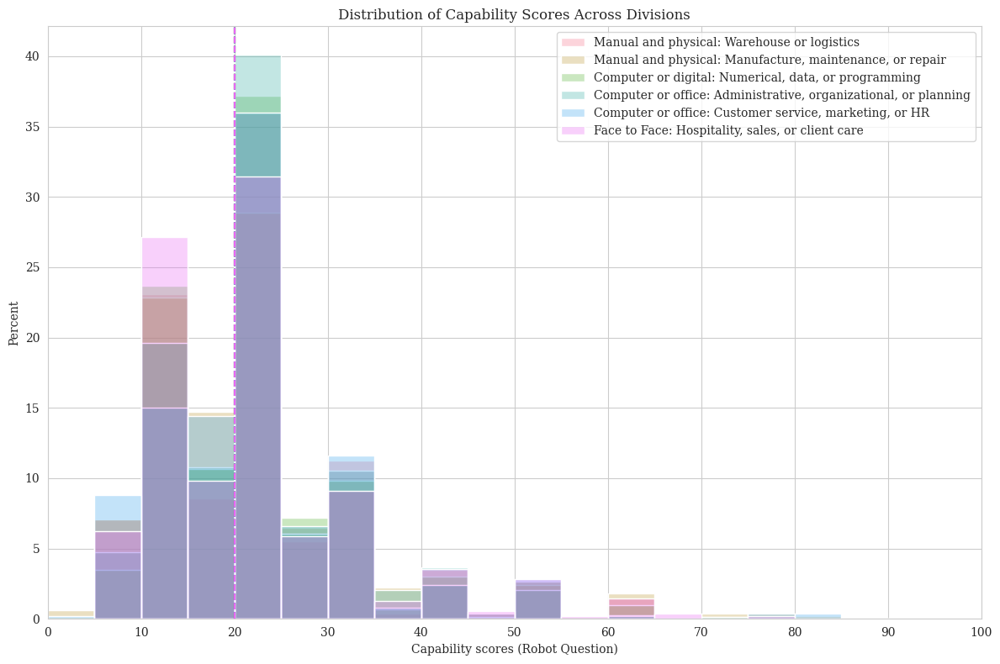

In [73]:
plt.figure(figsize=(12, 8))

palette = sns.color_palette("husl", len(melted_data_capabilities['division_map'].unique()))
bins = np.linspace(0, 100, 21)
# Iterate through each division
for i, division in enumerate(melted_data_capabilities['division_map'].unique()):
    # Subset the data for each division
    division_data = melted_data_capabilities[melted_data_capabilities['division_map'] == division]['Capability_score']

    # Plot the distribution
    #sns.kdeplot(division_data, label=division_mapping[division], color=palette[i], fill=True, alpha=0.1)
    sns.histplot(division_data, label=division, kde=False, bins=bins, color=palette[i],
                 alpha=0.3,stat='percent')
    #plt.hist(division_data, bins=bins, histtype='stepfilled', label=division_mapping[division],
    #         color=palette[i], alpha=0.8, linewidth=2, density=True)
    # Plot the mean as a vertical line
    plt.axvline(division_data.mean(), color=palette[i], linestyle='--')
    print(division_data.mean())

plt.xlim(left=0,right=100)
plt.xticks(range(0, 101, 10))
plt.xlabel('Capability scores (Robot Question)')
plt.ylabel('Percent')
plt.title('Distribution of Capability Scores Across Divisions')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [74]:
melted_data_capabilities['Capability_score'].median()

np.float64(20.0)

In [75]:
melted_data_capabilities.groupby('division_map', observed=False)['Capability_score'].median()

division_map
Manual and physical: Manufacture, maintenance, or repair           20.0
Manual and physical: Warehouse or logistics                        20.0
Computer or digital: Numerical, data, or programming               20.0
Computer or office: Administrative, organizational, or planning    20.0
Computer or office: Customer service, marketing, or HR             20.0
Face to Face: Hospitality, sales, or client care                   20.0
Name: Capability_score, dtype: float64

In [76]:
melted_data_capabilities['Capability_score'].value_counts()

Capability_score
20.0    1219
10.0     731
15.0     383
30.0     354
25.0     202
5.0      198
40.0     109
50.0      88
35.0      43
60.0      33
12.0      15
45.0      10
18.0       7
13.0       7
28.0       6
70.0       5
75.0       5
22.0       5
8.0        5
27.0       5
14.0       4
23.0       4
80.0       3
7.0        3
3.0        3
26.0       3
17.0       2
29.0       2
65.0       2
55.0       2
7.5        2
2.0        2
16.0       2
36.0       1
37.0       1
19.0       1
9.0        1
34.0       1
21.0       1
Name: count, dtype: int64

In [77]:
melted_data_capabilities.groupby('division_map',observed=False)['Capability_score'].value_counts()

division_map                                              Capability_score
Manual and physical: Manufacture, maintenance, or repair  20.0                143
                                                          10.0                111
                                                          15.0                 71
                                                          30.0                 45
                                                          5.0                  32
                                                                             ... 
Face to Face: Hospitality, sales, or client care          29.0                  0
                                                          36.0                  0
                                                          37.0                  0
                                                          70.0                  0
                                                          80.0                  0
Name: count, Length: 23

In [78]:
melted_data_capabilities.head()

,PID,division_map,RobotTune,Capability_score,TaskNumber,CapabilityNumber,TaskName_map,Capability_map
12,R_2lXN7eLA5CWYXN4,Manual and physical: Warehouse or logistics,RobotTune_1_1,10.0,1,1,getting information,episodic memory
13,R_1DTAsm4BnpXXinb,Manual and physical: Warehouse or logistics,RobotTune_1_1,10.0,1,1,getting information,episodic memory
18,R_5OyMkCgQ8fACPHH,Manual and physical: Warehouse or logistics,RobotTune_1_1,10.0,1,1,getting information,episodic memory
24,R_3R9T69D0KBDm9Z7,"Manual and physical: Manufacture, maintenance,...",RobotTune_1_1,10.0,1,1,getting information,episodic memory
42,R_6SSlbEDFDixQoYV,"Computer or digital: Numerical, data, or progr...",RobotTune_1_1,10.0,1,1,getting information,episodic memory


,division_map,Capability_map,sum_capability,total_people,mean_capability
0,"Manual and physical: Manufacture, maintenance,...",affordances,617.0,20,6.170000
1,"Manual and physical: Manufacture, maintenance,...",attribution,405.0,20,4.050000
2,"Manual and physical: Manufacture, maintenance,...",causal reasoning,460.0,20,4.600000
3,"Manual and physical: Manufacture, maintenance,...",cognitive flexibility,568.0,20,5.680000
4,"Manual and physical: Manufacture, maintenance,...",communication,1100.0,20,11.000000
...,...,...,...,...,...
97,"Face to Face: Hospitality, sales, or client care",procedural memory,816.0,23,7.095652
98,"Face to Face: Hospitality, sales, or client care",prospective memory,350.0,23,3.043478
99,"Face to Face: Hospitality, sales, or client care",semantic memory,974.0,23,8.469565
100,"Face to Face: Hospitality, sales, or client care",spatial navigation,248.0,23,2.156522


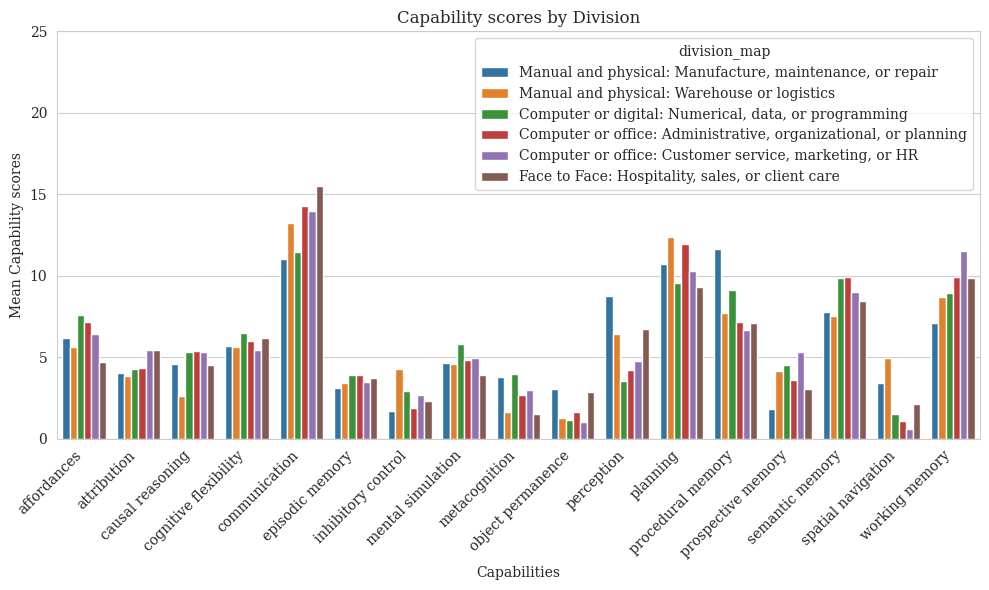

In [79]:
total_people_per_division_c = data_tasks_melted.groupby('division_map')['PID'].nunique().reset_index()
total_people_per_division_c.columns = ['division_map', 'total_people']
total_people_per_division_c

task_stats_div_c = melted_data_capabilities.groupby(['division_map', 'Capability_map'],observed=False).agg(
     sum_capability=('Capability_score', 'sum'),
).reset_index()

task_stats_d_capability = pd.merge(task_stats_div_c, total_people_per_division_c, on='division_map')
task_stats_d_capability['mean_capability'] = task_stats_d_capability['sum_capability'] / (task_stats_d_capability['total_people'] * 5)

display(task_stats_d_capability)

#for col in ['division_map','TaskName_map']:
#
#    if col == 'division_map':
#        title = 'Division'
#    else:
#        title = 'Tasks'
plt.figure(figsize=(10, 6))

#sns.barplot(x='TaskName_map', y='InvertedTaskRank', data=data_tasks_melted, errorbar='se',hue='TaskName_map')
sns.barplot(x='Capability_map', y='mean_capability', data=task_stats_d_capability, hue='division_map', errorbar=None)
# Set labels and title
plt.xlabel(f'Capabilities')
plt.ylabel(f'Mean Capability scores')
plt.title(f'Capability scores by Division')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.ylim(0, 25)
# Show the plot
plt.tight_layout()
plt.show()

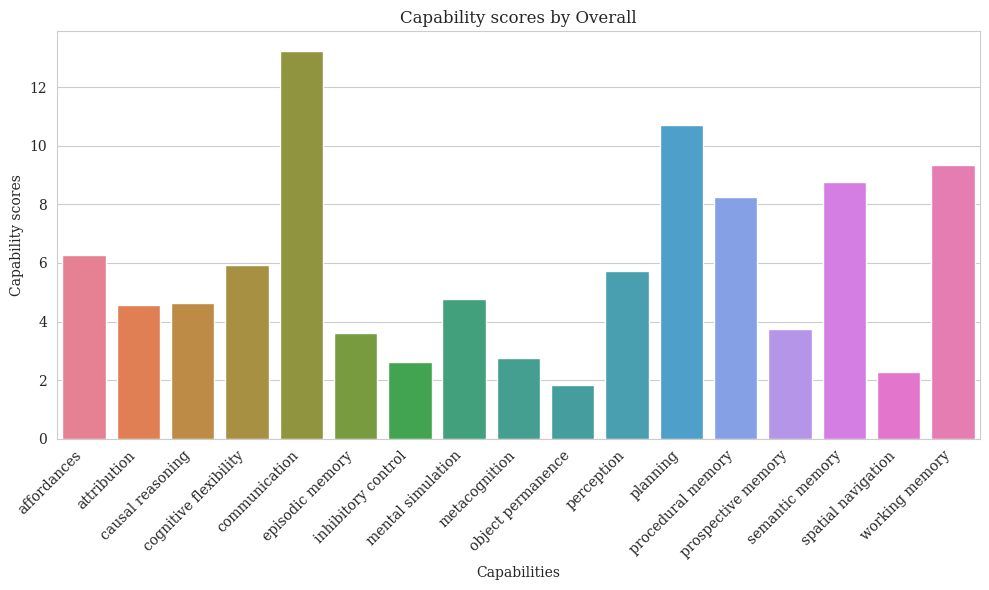

In [80]:
total_rankings_c = task_stats_d_capability.groupby('Capability_map')[['mean_capability']].mean()


plt.figure(figsize=(10, 6))

#sns.barplot(x='TaskName_map', y='InvertedTaskRank', data=data_tasks_melted, errorbar='se',hue='TaskName_map')
sns.barplot(x='Capability_map', y='mean_capability', data=total_rankings_c, hue='Capability_map', errorbar=None)
# Set labels and title
plt.xlabel('Capabilities')
plt.ylabel('Capability scores')
plt.title('Capability scores by Overall')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Show the plot
plt.tight_layout()
plt.show()

,division_map,Capability_map,TaskName_map,sum_capability,total_people,mean_capability
0,"Manual and physical: Manufacture, maintenance,...",affordances,admin,40.0,20,2.000000
1,"Manual and physical: Manufacture, maintenance,...",affordances,analysing data,27.0,20,1.350000
2,"Manual and physical: Manufacture, maintenance,...",affordances,building rapport,10.0,20,0.500000
3,"Manual and physical: Manufacture, maintenance,...",affordances,communicating,10.0,20,0.500000
4,"Manual and physical: Manufacture, maintenance,...",affordances,computer work,30.0,20,1.500000
...,...,...,...,...,...,...
1219,"Face to Face: Hospitality, sales, or client care",working memory,getting information,103.0,23,4.478261
1220,"Face to Face: Hospitality, sales, or client care",working memory,judging quality,30.0,23,1.304348
1221,"Face to Face: Hospitality, sales, or client care",working memory,managing,110.0,23,4.782609
1222,"Face to Face: Hospitality, sales, or client care",working memory,manual work,87.0,23,3.782609


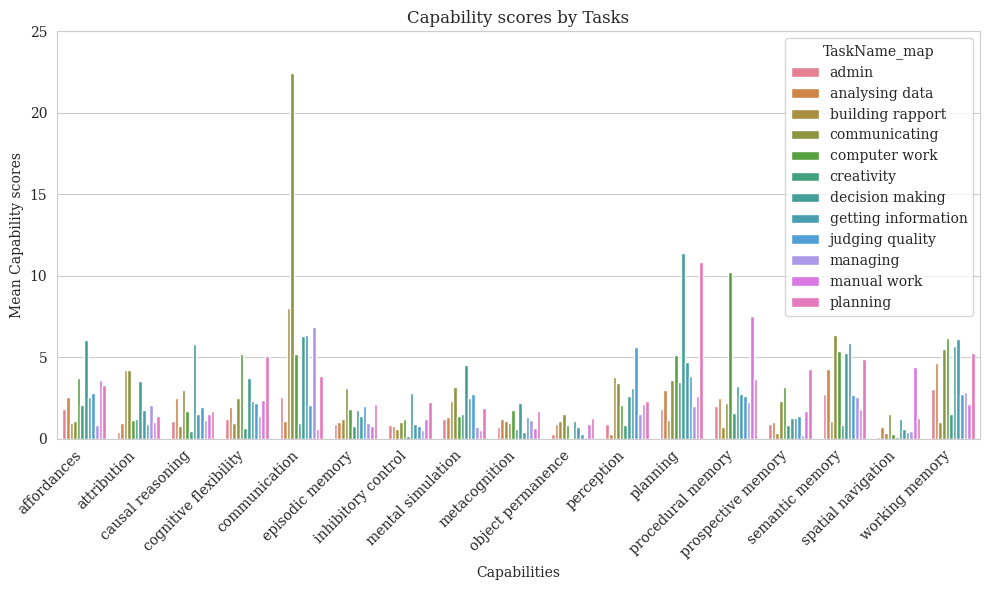

In [81]:
total_people_per_division_c_t = data_tasks_melted.groupby('division_map')['PID'].nunique().reset_index()
total_people_per_division_c_t.columns = ['division_map', 'total_people']
total_people_per_division_c_t

task_stats_div_c_t = melted_data_capabilities.groupby(['division_map', 'Capability_map','TaskName_map'],observed=False).agg(
     sum_capability=('Capability_score', 'sum'),
).reset_index()

task_stats_d_capability_task = pd.merge(task_stats_div_c_t, total_people_per_division_c_t, on='division_map')
task_stats_d_capability_task['mean_capability'] = task_stats_d_capability_task['sum_capability'] / task_stats_d_capability_task['total_people']

display(task_stats_d_capability_task)

#for col in ['division_map','TaskName_map']:
#
#    if col == 'division_map':
#        title = 'Division'
#    else:
#        title = 'Tasks'
plt.figure(figsize=(10, 6))

#sns.barplot(x='TaskName_map', y='InvertedTaskRank', data=data_tasks_melted, errorbar='se',hue='TaskName_map')
sns.barplot(x='Capability_map', y='mean_capability', data=task_stats_d_capability_task, hue='TaskName_map', errorbar=None)
# Set labels and title
plt.xlabel(f'Capabilities')
plt.ylabel(f'Mean Capability scores')
plt.title(f'Capability scores by Tasks')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.ylim(0, 25)
# Show the plot
plt.tight_layout()
plt.show()

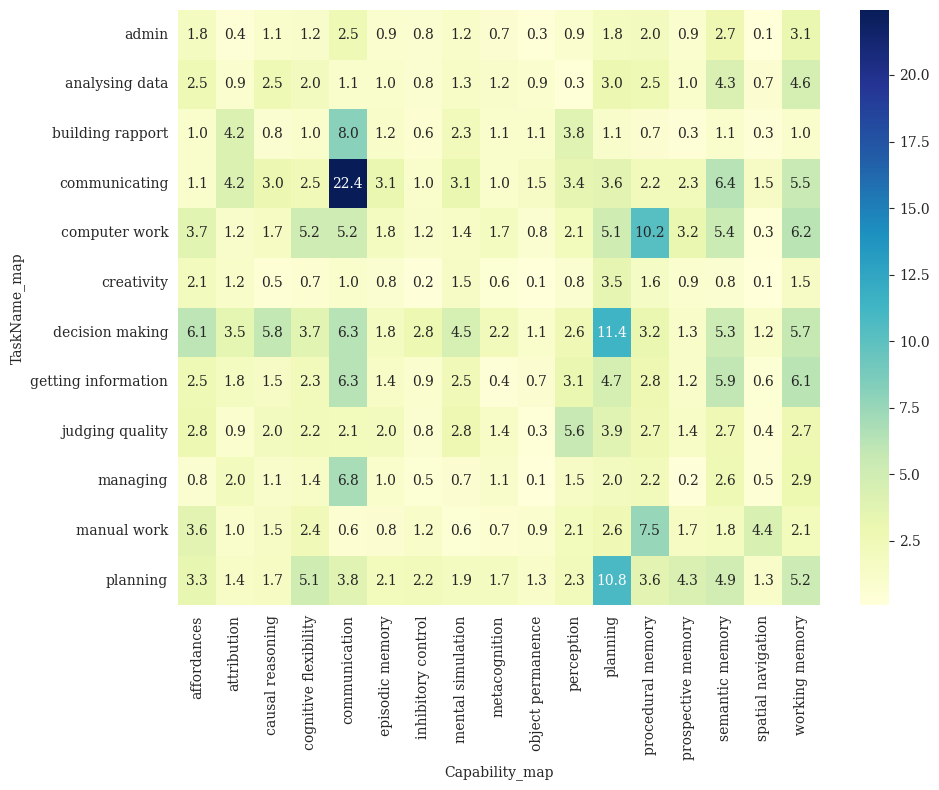

In [82]:
pivot_data_agg = task_stats_d_capability_task.pivot_table(
    index='TaskName_map', columns='Capability_map', values='mean_capability', aggfunc='mean'
)

plt.figure(figsize=(10, 8))
sns.heatmap(pivot_data_agg,annot=True,fmt=".1f",cmap="YlGnBu", cbar=True)

# Display the plot
plt.tight_layout()
plt.show()

<Figure size 2000x1600 with 0 Axes>

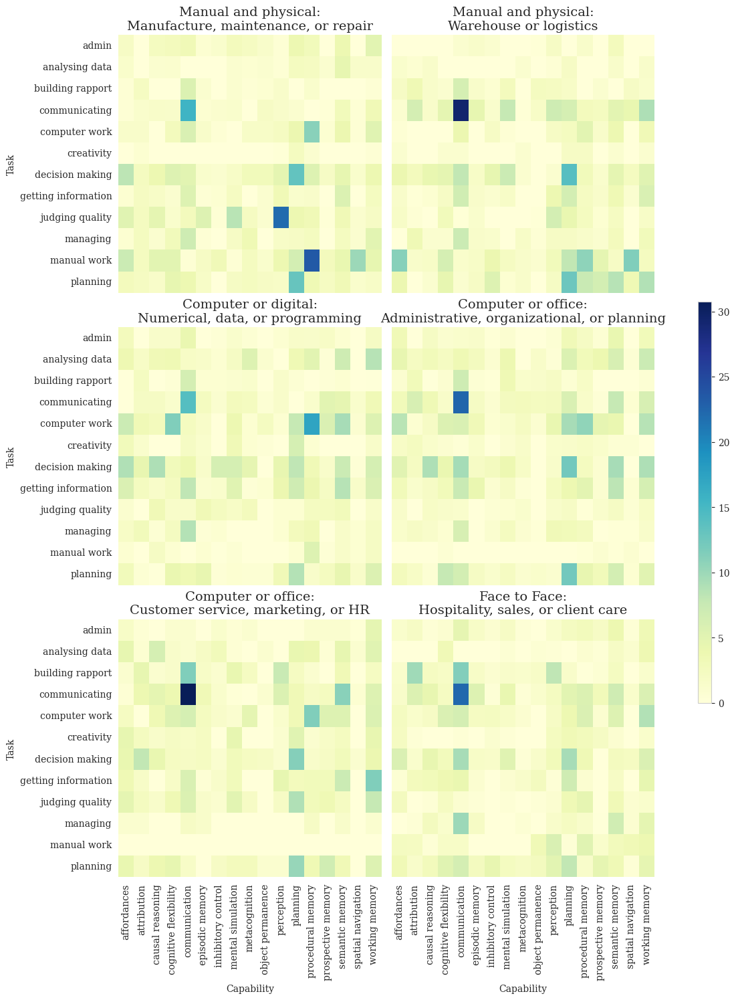

In [83]:
vmin = task_stats_d_capability_task['mean_capability'].min()
vmax = task_stats_d_capability_task['mean_capability'].max()

task_stats_d_capability_task['division_map_new_line'] = task_stats_d_capability_task['division_map'].str.replace(r':\s*', ':\n', regex=True)

plt.figure(figsize=(20, 16))
# Create a FacetGrid to create separate heatmaps for each division_map
g = sns.FacetGrid(task_stats_d_capability_task, col="division_map_new_line", col_wrap=2, height=5, aspect=1)

# Define a function to create a heatmap for each facet (division)
def create_heatmap(data, **kwargs):
    # Pivot the data for the current division
    pivot_data = data.pivot_table(index='TaskName_map', columns='Capability_map', values='mean_capability')

    # Plot the heatmap
    sns.heatmap(pivot_data, annot=False, cmap="YlGnBu", cbar=False, vmin=vmin, vmax=vmax, **kwargs)

# Map the heatmap function to the grid
g.map_dataframe(create_heatmap)

cbar_ax = g.fig.add_axes([1.05, 0.3, 0.02, 0.4])  # Position for the color bar
norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap="YlGnBu", norm=norm)
sm.set_array([])  # Only needed for compatibility with older versions of matplotlib
g.fig.colorbar(sm, cax=cbar_ax)

# Set titles and labels
g.set_axis_labels("Capability", "Task")
g.set_titles(col_template="{col_name}", size=14)

# Display the plot
plt.show()

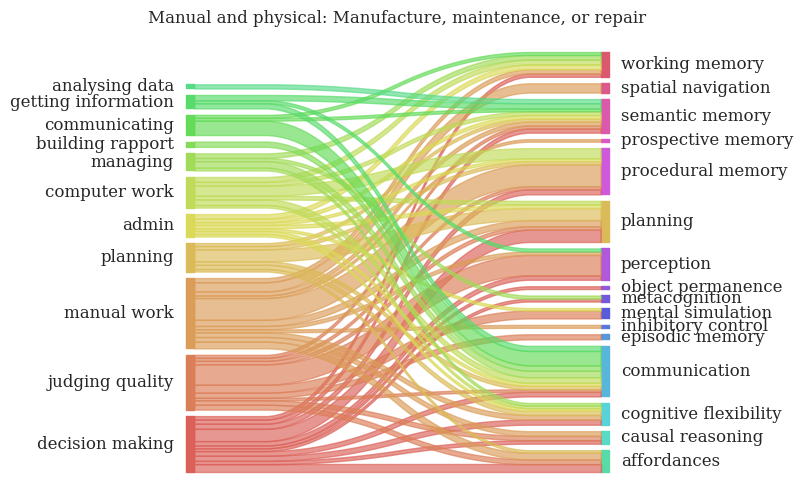

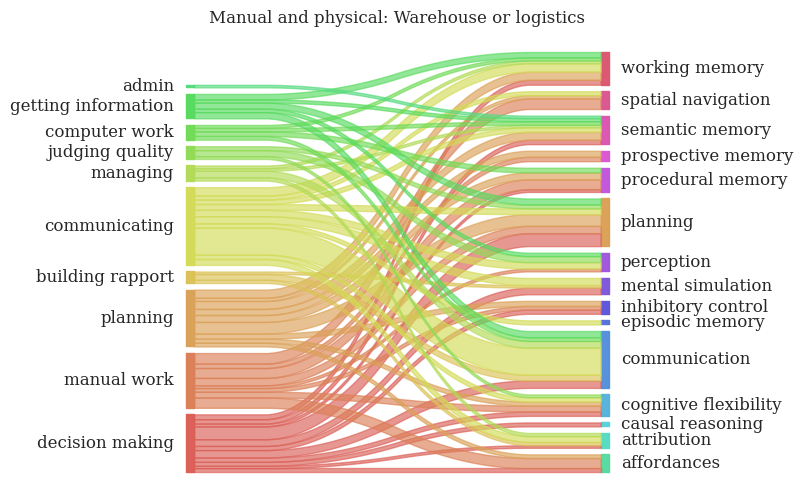

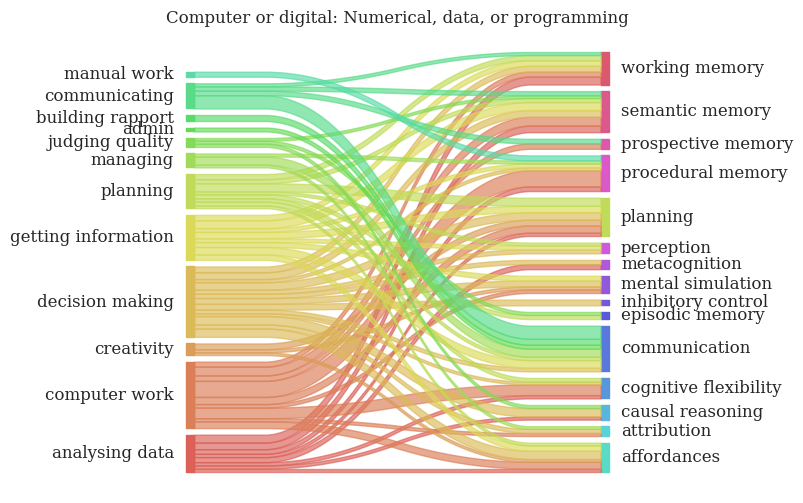

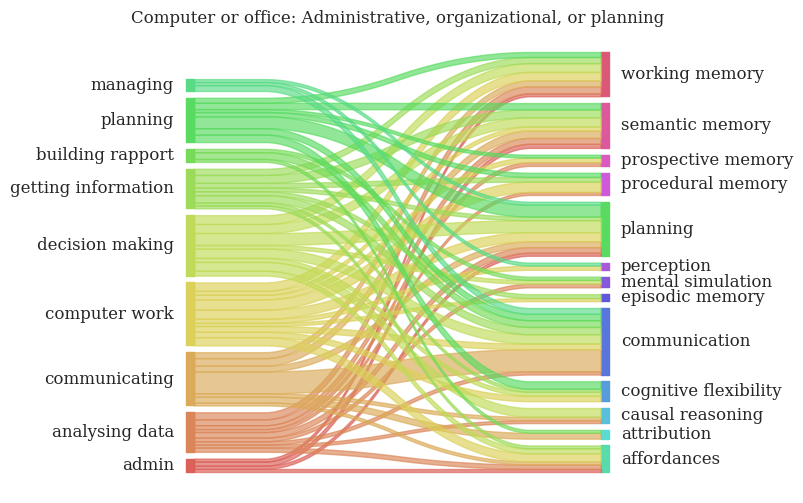

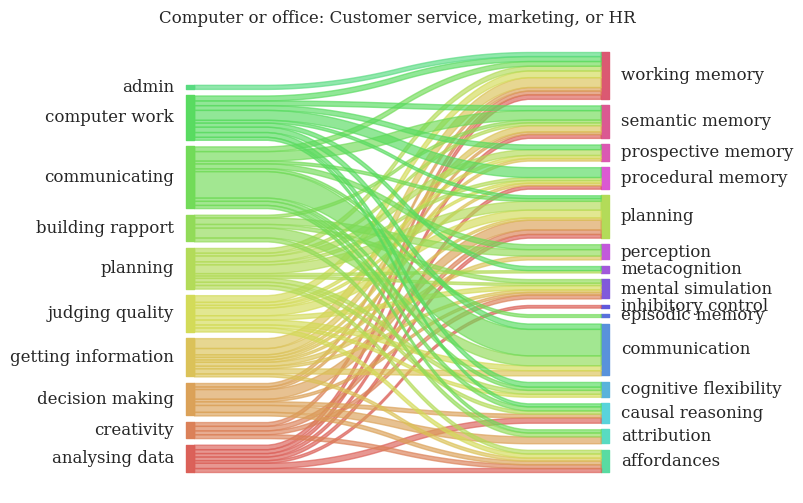

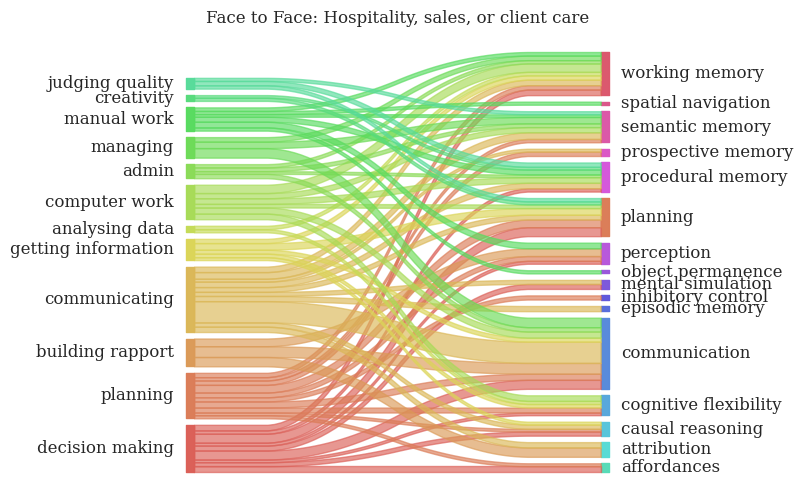

In [148]:
divisions = task_stats_d_capability_task['division_map'].unique()

percentile = task_stats_d_capability_task[task_stats_d_capability_task['mean_capability'] >= task_stats_d_capability_task['mean_capability'].quantile(0.7)]

left_labels_ordered = percentile["TaskName_map"].unique()
right_labels_ordered = percentile["Capability_map"].unique()  # Change order here if necessary


for division in divisions:
    
    division_data = percentile[percentile['division_map'] == division]
    division_data = division_data.reset_index(drop=True)
    
    fig.set_size_inches(20, 10)
    
    sankey(
    left=division_data["TaskName_map"], right=division_data["Capability_map"],
    leftWeight= division_data["mean_capability"], rightWeight=division_data["mean_capability"],
    aspect=40, fontsize=12)
    
    plt.title(division)

    plt.show()

In [111]:
divisions

array(['Manual and physical: Manufacture, maintenance, or repair',
       'Manual and physical: Warehouse or logistics',
       'Computer or digital: Numerical, data, or programming',
       'Computer or office: Administrative, organizational, or planning',
       'Computer or office: Customer service, marketing, or HR',
       'Face to Face: Hospitality, sales, or client care'], dtype=object)

In [144]:
left_labels_ordered

array(['decision making', 'judging quality', 'manual work', 'planning',
       'building rapport', 'getting information', 'managing', 'admin',
       'computer work', 'communicating', 'analysing data', 'creativity'],
      dtype=object)

In [133]:
division_data

,division_map,Capability_map,TaskName_map,sum_capability,total_people,mean_capability,division_map_new_line
0,Manual and physical: Warehouse or logistics,affordances,analysing data,25.0,20,1.25,Manual and physical:\nWarehouse or logistics
1,Manual and physical: Warehouse or logistics,affordances,building rapport,40.0,20,2.00,Manual and physical:\nWarehouse or logistics
2,Manual and physical: Warehouse or logistics,affordances,decision making,80.0,20,4.00,Manual and physical:\nWarehouse or logistics
3,Manual and physical: Warehouse or logistics,affordances,getting information,30.0,20,1.50,Manual and physical:\nWarehouse or logistics
4,Manual and physical: Warehouse or logistics,affordances,judging quality,35.0,20,1.75,Manual and physical:\nWarehouse or logistics
...,...,...,...,...,...,...,...
111,Manual and physical: Warehouse or logistics,working memory,getting information,120.0,20,6.00,Manual and physical:\nWarehouse or logistics
112,Manual and physical: Warehouse or logistics,working memory,judging quality,35.0,20,1.75,Manual and physical:\nWarehouse or logistics
113,Manual and physical: Warehouse or logistics,working memory,managing,60.0,20,3.00,Manual and physical:\nWarehouse or logistics
114,Manual and physical: Warehouse or logistics,working memory,manual work,50.0,20,2.50,Manual and physical:\nWarehouse or logistics


In [114]:
division_data.isnull().sum()

division_map             0
Capability_map           0
TaskName_map             0
sum_capability           0
total_people             0
mean_capability          0
division_map_new_line    0
dtype: int64